#**Breast Cancer Dataset**
**Binary Classification Prediction for type of Breast Cancer**

The key challenges against it’s detection is how to classify tumors into malignant (cancerous) or benign(non cancerous). The dataset contains following columns:'id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst', 'diagnosis'.

**Author:** Prarthna Nemade

#**ABSTRACT:**

*   Understand the Dataset & cleanup.
*   Build classification models to predict whether the cancer type is      Malignant or Benign.
*   Fitting a linear model and interpreting the regression coefficients.
*   Run SHAP analysis on the models, interpreting the SHAP values.








In [1]:
#Importing all the neccessary libraries

!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install --upgrade scikit-learn


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 kB 10.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=767a928b97254d2c7f216cb41db3e51c9aad3979a4b9e5dad8ff314975c0bdac
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: ht

In [2]:
import pandas as pd
import shap
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn_pandas import DataFrameMapper
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
import lime
from lime import lime_tabular
import random
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.image as mpimg
import random, os, sys
from datetime import datetime
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (32, 24)


In [3]:
#Reading the dataset

df = pd.read_csv("https://github.com/PrarthanaNemade14/Breast_Cancer-EDA/raw/main/breast-cancer.csv")


In [4]:
# Printing numerical and categorical columns

numeric_columns = []
categorical_columns = []

# Iterate through each column in the dataset
for column in df.columns:
    # Checking if the column is of numeric data type
    if df[column].dtype in ['int64', 'float64']:
        numeric_columns.append(column)
    # Check if the column is of categorical data type
    elif df[column].dtype in ['object']:
        categorical_columns.append(column)

# Print
print("The Numeric and Categorical values are:")
print("----------------------------------------")
print("Numeric Columns:", numeric_columns)

# Print 
print("\nCategorical Columns:", categorical_columns)

The Numeric and Categorical values are:
----------------------------------------
Numeric Columns: ['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']

Categorical Columns: ['diagnosis']


In [5]:
#Checking for null values in the dataset

df.isna().sum()


id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

Here, we can see that there are no null values in the dataset. And hence, there is no need for imputing the data.

In [6]:
#Describing the data

df.describe()


,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


This table shows summary statistics for a dataset with 1000 observations and 07 variables.

The variables are: id,	radius_mean,	texture_mean,	perimeter_mean,	area_mean,	smoothness_mean,	compactness_mean,	concavity_mean,	concave points_mean,	symmetry_mean,...	radius_worst,	texture_worst,	perimeter_worst,	area_worst,	smoothness_worst,	compactness_worst,	concavity_worst,	concave points_worst,	symmetry_worst,	fractal_dimension_worst.

The "count" row shows the number of observations for each variable, while the "mean" row shows the average value of each variable.

The "std" row shows the standard deviation of each variable, which is a measure of how much the values vary from the mean.

The "min" and "max" rows show the smallest and largest values observed for each variable.

The "25%", "50%", and "75%" rows show the values at the 25th, 50th, and 75th percentiles of the distribution, respectively.

These percentiles divide the observations into quarters, with the 25th percentile being the value below which 25% of the observations fall, and so on.

In [7]:
print(df)

           id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0      842302         M        17.99         10.38          122.80     1001.0   
1      842517         M        20.57         17.77          132.90     1326.0   
2    84300903         M        19.69         21.25          130.00     1203.0   
3    84348301         M        11.42         20.38           77.58      386.1   
4    84358402         M        20.29         14.34          135.10     1297.0   
..        ...       ...          ...           ...             ...        ...   
564    926424         M        21.56         22.39          142.00     1479.0   
565    926682         M        20.13         28.25          131.20     1261.0   
566    926954         M        16.60         28.08          108.30      858.1   
567    927241         M        20.60         29.33          140.10     1265.0   
568     92751         B         7.76         24.54           47.92      181.0   

     smoothness_mean  compa

#**EXPLORATORY DATA ANALYSIS (EDA):**
****
EDA stands for exploratory data analysis. It is an approach to analyzing and understanding data in order to identify patterns, relationships, and trends. EDA involves using various statistical and graphical techniques to explore data sets and gain insights into the underlying data structure.

The main goal of EDA is to discover and understand the main features of the data, including its distribution, central tendency, variability, and outliers. This can involve plotting the data using histograms, scatter plots, box plots, and other visualization techniques, as well as calculating summary statistics such as means, medians, and standard deviations.

EDA is an important step in the data analysis process, as it can help to identify potential problems or biases in the data, as well as highlight interesting patterns or relationships that may be of interest to researchers or analysts. By gaining a deeper understanding of the data, analysts can make more informed decisions and develop more accurate models or hypotheses based on the data.

<Figure size 800x500 with 0 Axes>

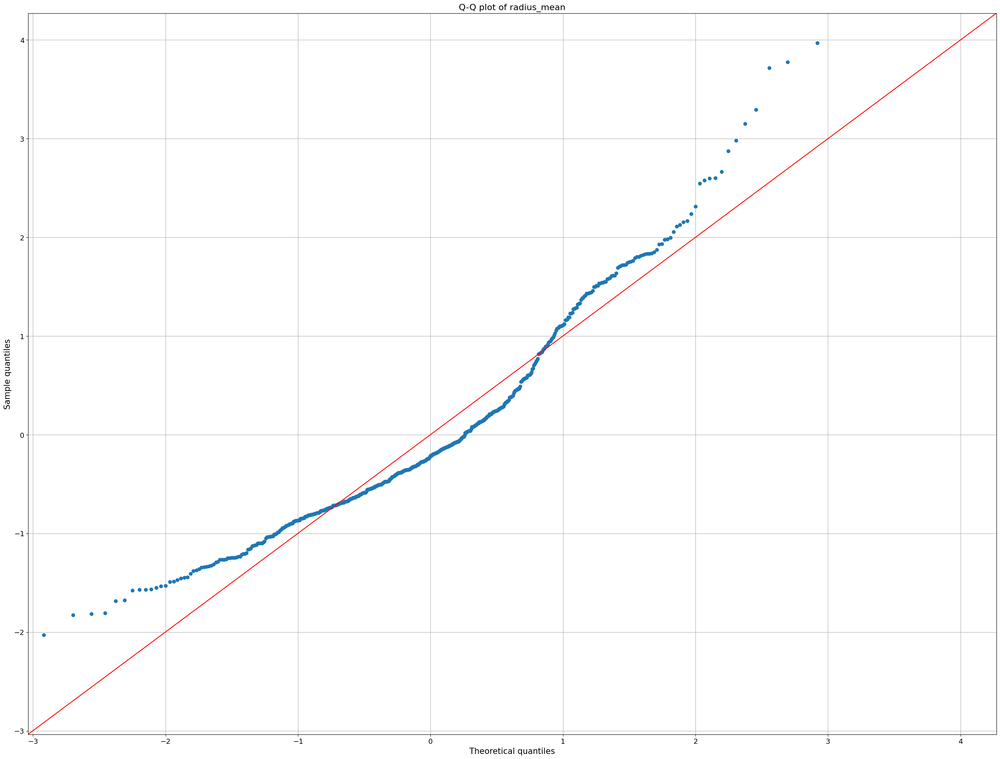

<Figure size 800x500 with 0 Axes>

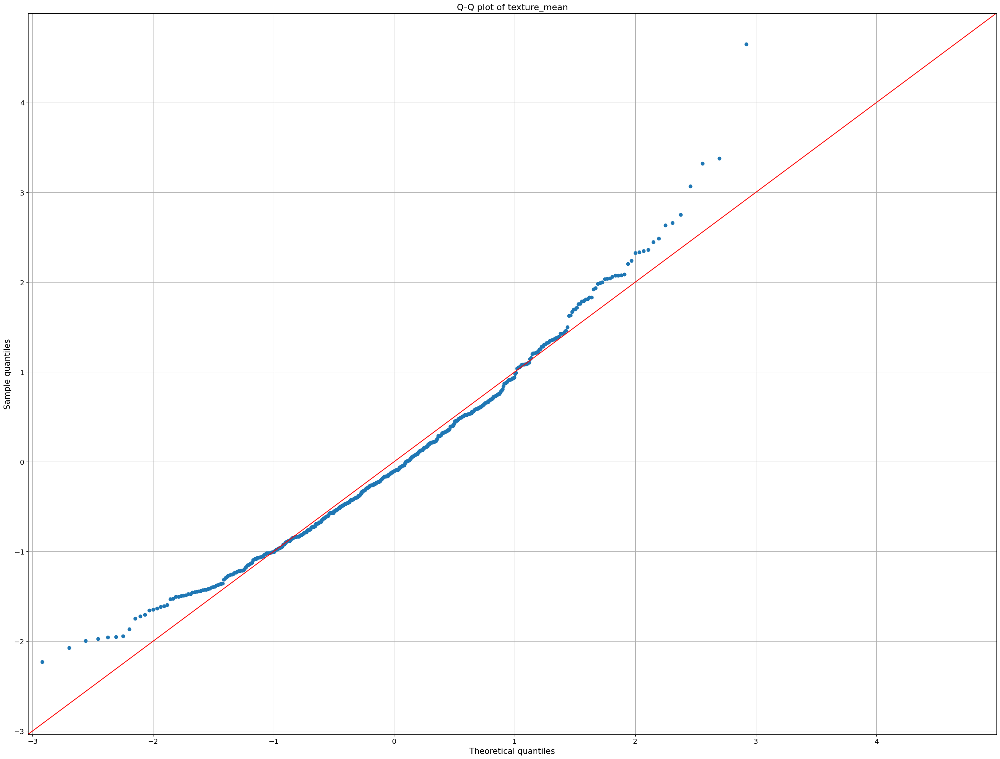

<Figure size 800x500 with 0 Axes>

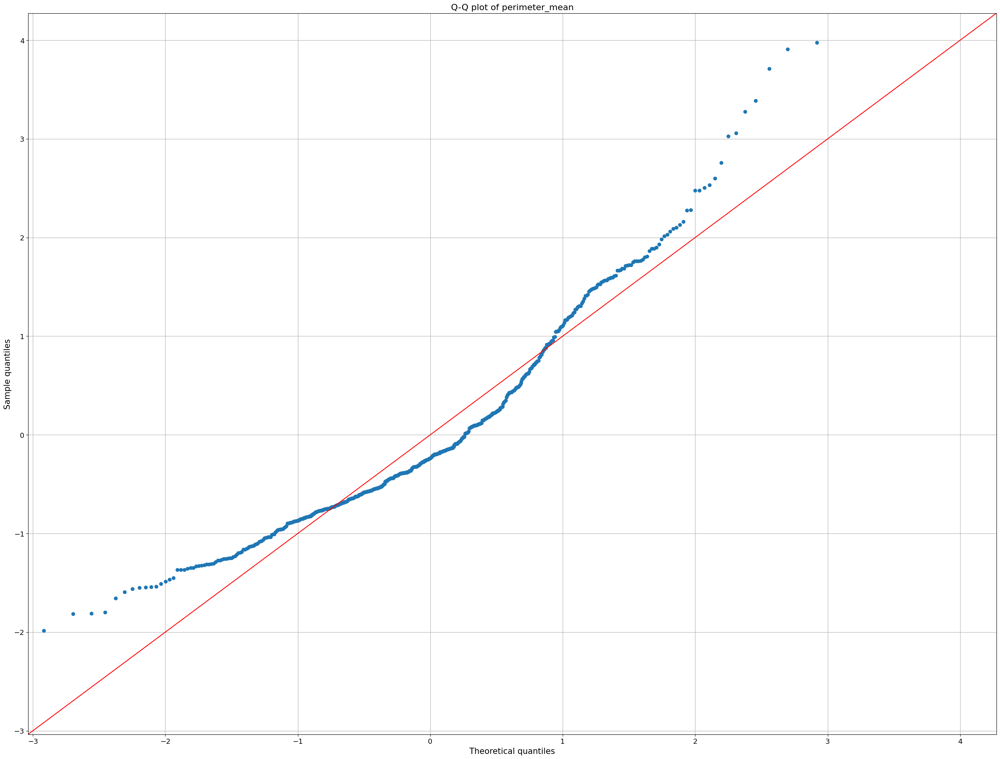

<Figure size 800x500 with 0 Axes>

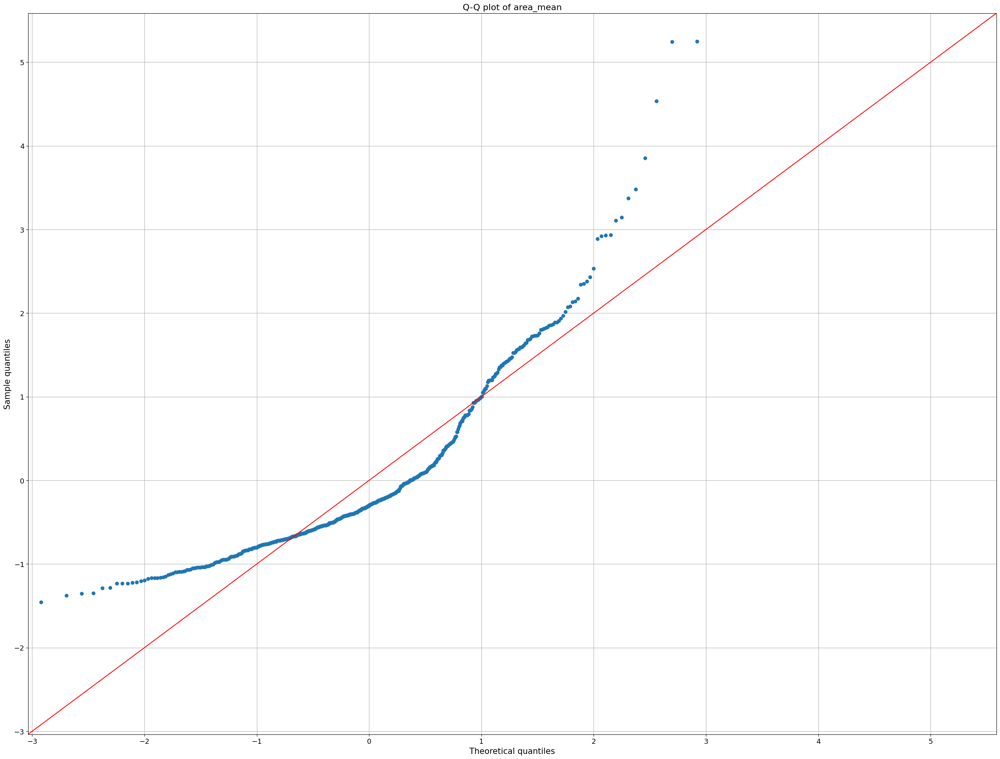

<Figure size 800x500 with 0 Axes>

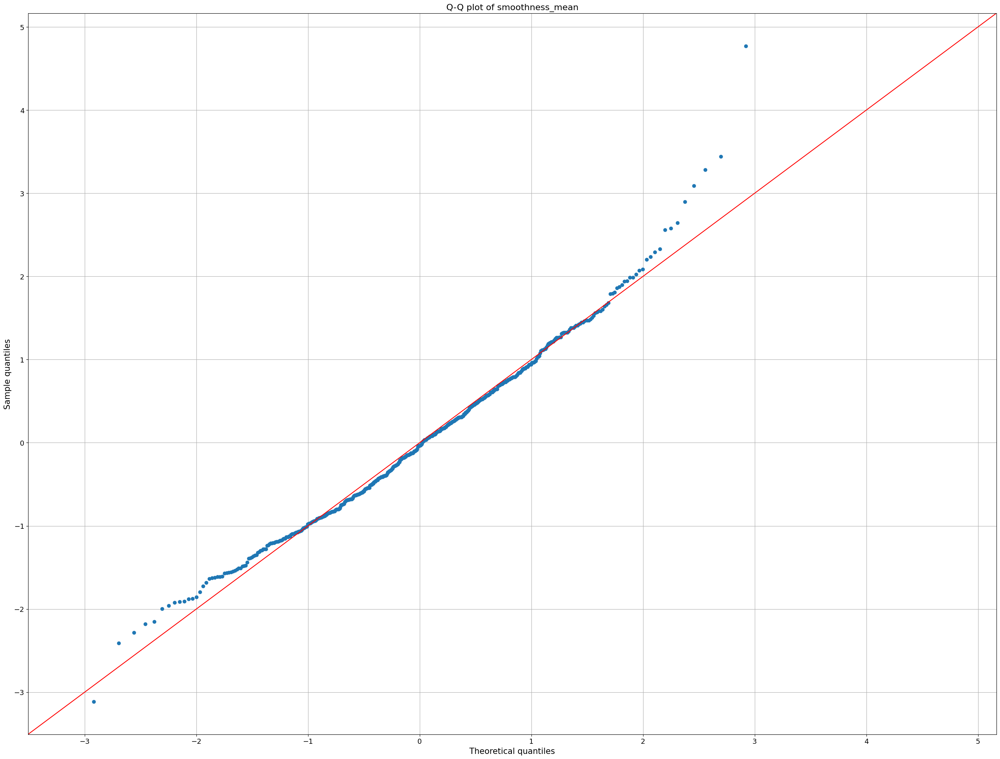

<Figure size 800x500 with 0 Axes>

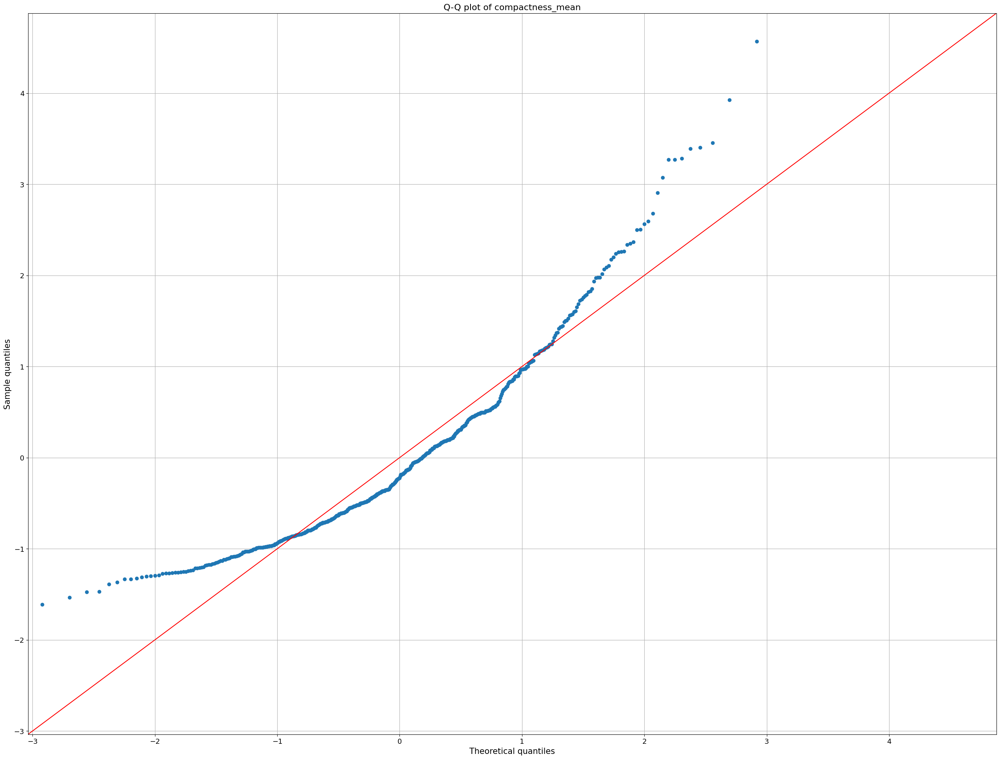

<Figure size 800x500 with 0 Axes>

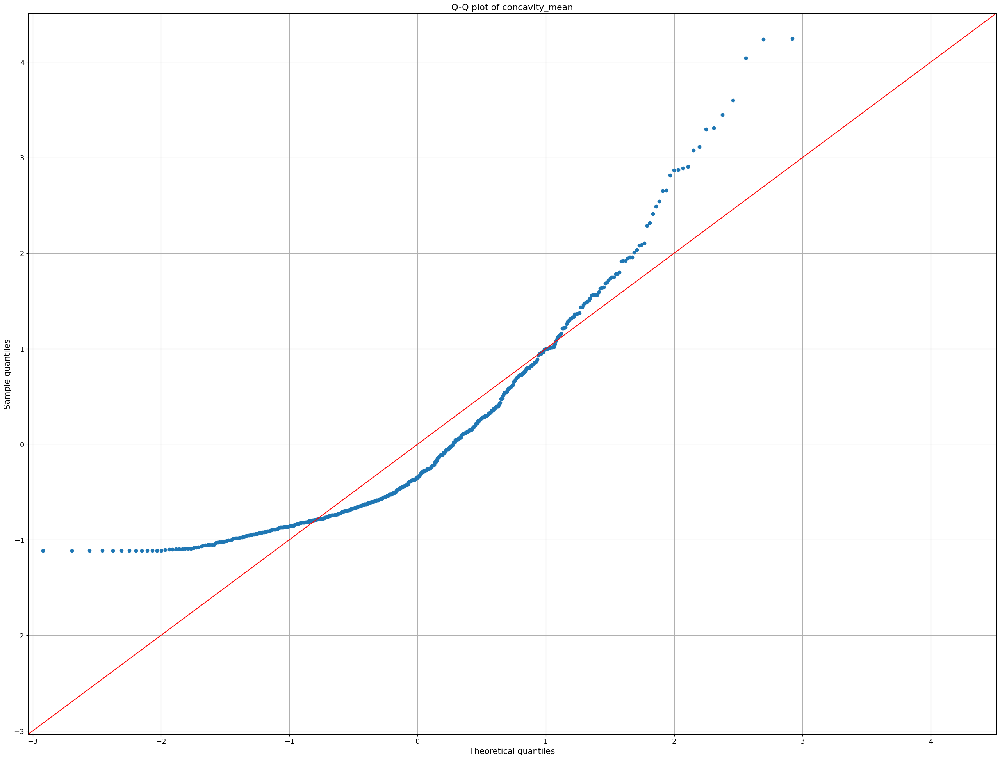

<Figure size 800x500 with 0 Axes>

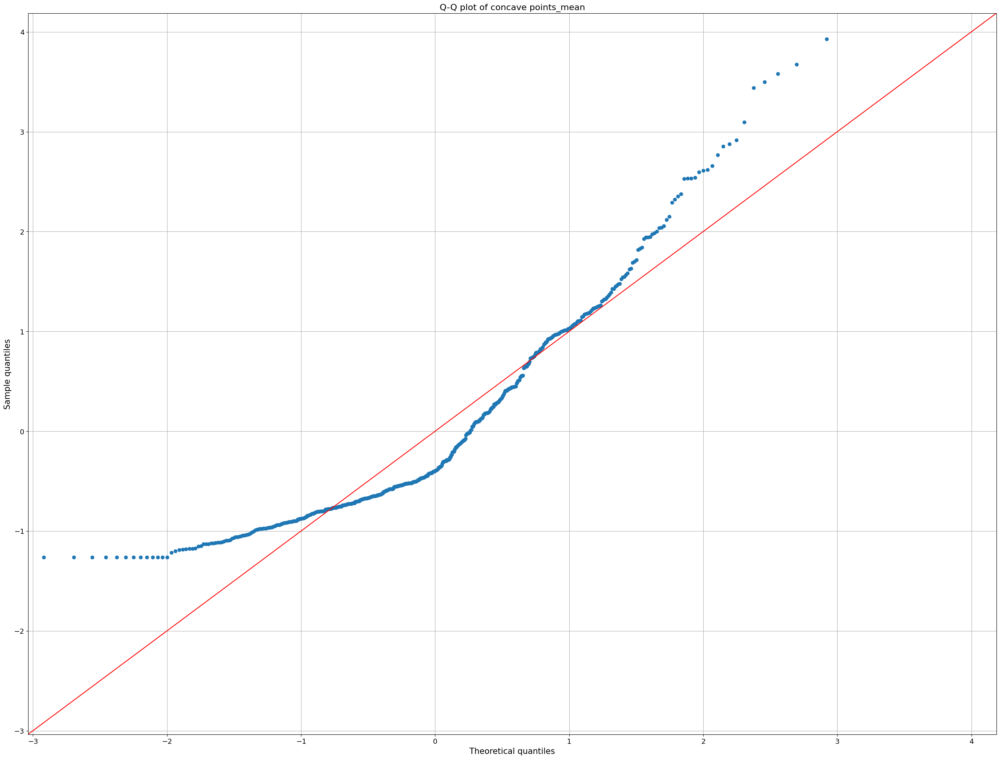

<Figure size 800x500 with 0 Axes>

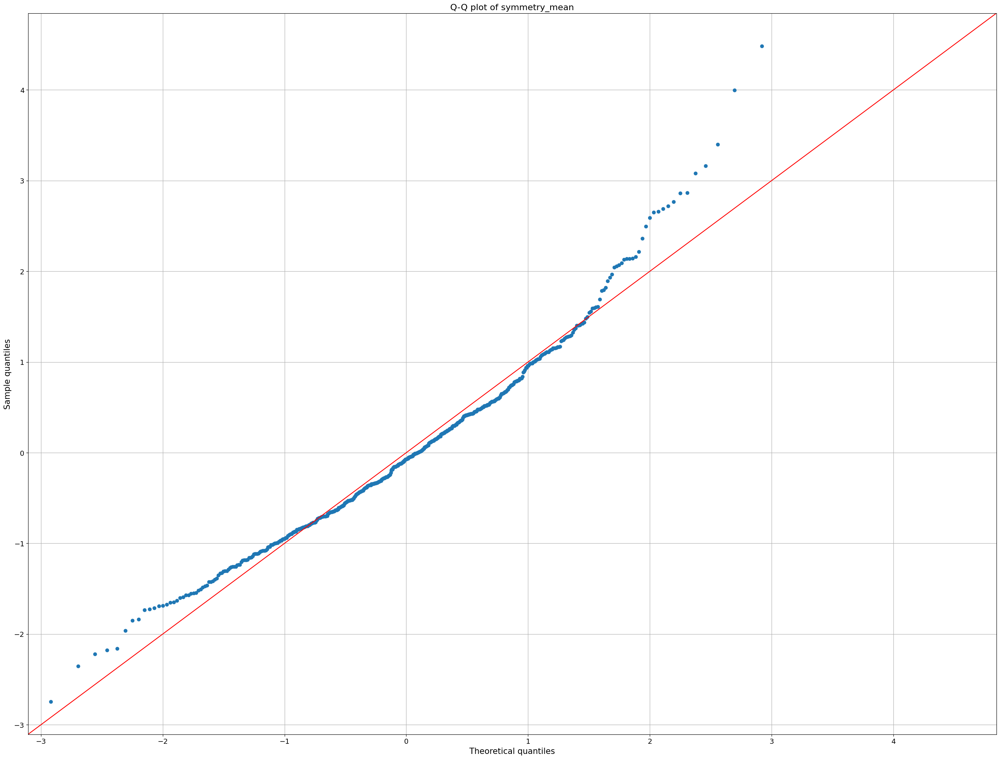

In [8]:
# checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot

data_norm = df[
    ["radius_mean", "texture_mean", "perimeter_mean", "area_mean", "smoothness_mean",
     "compactness_mean", "concavity_mean", "concave points_mean", "symmetry_mean"
     ]
]
for c in data_norm.columns[:]:
    plt.figure(figsize=(8, 5))
    fig = qqplot(data_norm[c], line="45", fit="True")
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Theoretical quantiles", fontsize=15)
    plt.ylabel("Sample quantiles", fontsize=15)
    plt.title("Q-Q plot of {}".format(c), fontsize=16)
    plt.grid(True)
    plt.show()

**OBSERVATIONS:**

* Looking at the Q-Q plot above, it appears that all independent variables are roughly following normal distribution
* There are few outliers in few of the predictor variables.

<Axes: >

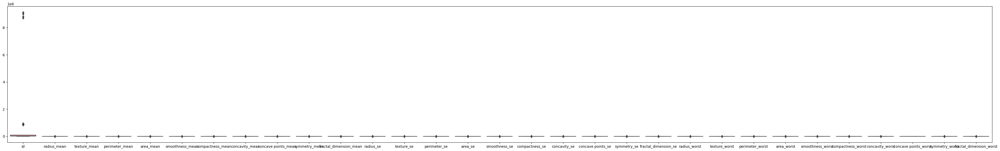

In [10]:
# Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(50, 7))
sns.boxplot(data=df)

The boxplot displays the median, quartiles, and outliers for each variable in the dataset.
Since the size of the plot is set to be 50 inches wide and 7 inches tall, the resulting visualization is quite large. The appearance of the plot depends on the specific data in the DataFrame, but it will generally consist of a set of boxes and whiskers for each variable, with the boxes representing the interquartile range (IQR) of the data and the whiskers representing the range of the data outside the IQR. Any outliers that fall outside the whiskers are displayed as individual points on the plot.

In [11]:
# Creating binary vaiables for sex

data = pd.get_dummies(df)

# Normalizing the data in the rings column beacuse the value is too high when compared to other independent variable

from sklearn import preprocessing

# Create x to store scaled values as floats
x = data[["area_mean"]].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Run the normalizer on the dataframe
data[["area_mean"]] = pd.DataFrame(x_scaled)

The given code involves two essential data preprocessing operations. Firstly, it creates binary variables for the categorical variable sex present in the df DataFrame. It utilizes the get_dummies() function of the pandas library to generate a new DataFrame with separate columns for each distinct value in the sex column. The new DataFrame's columns have binary values, where 1 represents the presence of the value and 0 indicates the absence of the same value. This technique is commonly used to transform categorical variables into a suitable format for machine learning models.

Secondly, the code performs normalization of the numerical variable area_mean in the data DataFrame. The process of normalization scales a variable's values within a specific range. Here, the area_mean variable's values are scaled between 0 to 1 using the MinMaxScaler() function available in the sklearn.preprocessing library.

Initially, the astype(float) method converts the area_mean variable values to floats. Further, a new variable x is created to store the scaled values, and a MinMaxScaler() object is created and fitted to x using the fit_transform() method. Finally, the scaled values are incorporated into the data DataFrame using the pd.DataFrame() function to create a new DataFrame, including only the normalized area_mean values.

These preprocessing steps enhance data suitability for machine learning analysis by creating the necessary binary format for categorical variables and ensuring numerical variables are on a similar scale.


In [12]:
# data after nromalizing and feature creation
data.head()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis_B,diagnosis_M
0,842302,17.99,10.38,122.80,0.363733,0.11840,0.27760,0.3001,0.14710,0.2419,...,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0,1
1,842517,20.57,17.77,132.90,0.501591,0.08474,0.07864,0.0869,0.07017,0.1812,...,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0,1
2,84300903,19.69,21.25,130.00,0.449417,0.10960,0.15990,0.1974,0.12790,0.2069,...,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0,1
3,84348301,11.42,20.38,77.58,0.102906,0.14250,0.28390,0.2414,0.10520,0.2597,...,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0,1
4,84358402,20.29,14.34,135.10,0.489290,0.10030,0.13280,0.1980,0.10430,0.1809,...,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0,1


<Axes: >

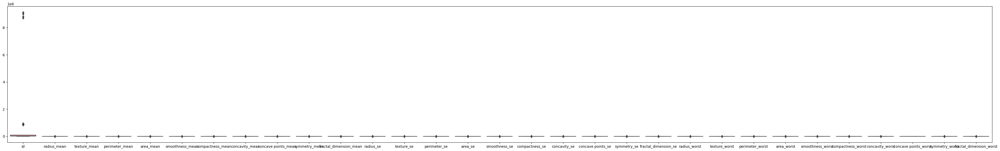

In [13]:
# Checking the Ranges of the predictor variables and dependent variable after normalizing
plt.figure(figsize=(50, 7))
sns.boxplot(data=df)

In [14]:
# checking the correlation between all the features in the data
data.corr()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis_B,diagnosis_M
id,1.000000,0.074626,0.099770,0.073159,0.096893,-0.012968,0.000096,0.050080,0.044158,-0.022114,...,0.079986,0.107187,0.010338,-0.002968,0.023203,0.035174,-0.044224,-0.029866,-0.039769,0.039769
radius_mean,0.074626,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,...,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066,-0.730029,0.730029
texture_mean,0.099770,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,...,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205,-0.415185,0.415185
perimeter_mean,0.073159,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,...,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019,-0.742636,0.742636
area_mean,0.096893,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,...,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738,-0.708984,0.708984
smoothness_mean,-0.012968,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,...,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316,-0.358560,0.358560
compactness_mean,0.000096,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,...,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382,-0.596534,0.596534
concavity_mean,0.050080,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,...,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930,-0.696360,0.696360
concave points_mean,0.044158,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,...,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661,-0.776614,0.776614
symmetry_mean,-0.022114,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,...,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413,-0.330499,0.330499


The resulting correlation matrix is a table that shows the pairwise correlations between all the columns in the DataFrame. The correlation coefficient ranges from -1 to 1, where a value of 1 indicates a perfect positive correlation, 0 indicates no correlation, and -1 indicates a perfect negative correlation. 

The matrix shows the correlation coefficients between each pair of features in the dataset. The diagonal line shows the perfect correlation of each feature with itself, which is always 1. The upper and lower triangles of the matrix are identical because the correlation between feature i and feature j is the same as the correlation between feature j and feature i.

Positive correlations (values close to 1) between two features indicate that when one feature increases, the other feature tends to increase as well. Negative correlations (values close to -1) between two features indicate that when one feature increases, the other feature tends to decrease.

<Axes: >

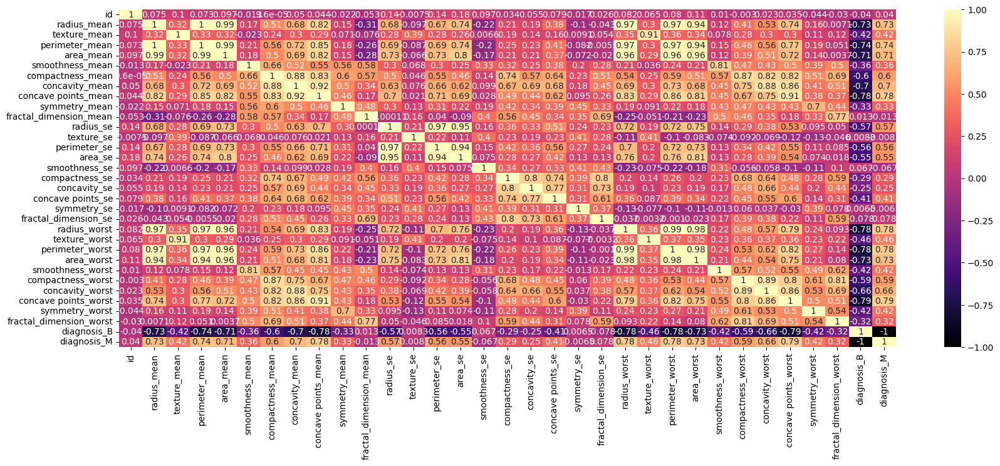

In [15]:
# the heat map of the correlation
plt.figure(figsize=(20, 7))
sns.heatmap(data.corr(), annot=True, cmap="magma")

CORRELATION ANALYSIS:

The graph above depicts the correlation between various features in the dataset. The heatmap shows a color matrix that represents the strength of the correlation between two variables.

A correlation coefficient, such as the Pearson correlation coefficient, can be used to calculate the correlation between two variables. This coefficient measures the linear relationship between two variables, with values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation) (perfect positive correlation). A value of 0 indicates that there is no correlation.

The correlation coefficients are represented as colors in a matrix in the heatmap above, with each variable plotted on both the x and y axes. The color of each cell in the matrix represents the strength of the correlation between the corresponding pair of variables, with a color scale ranging from low (e.g., light color) to high (e.g., dark color).

A correlation heatmap can assist in determining the relationships between variables in a dataset. It can be used to identify patterns and trends, as well as variables that are strongly correlated (either positively or negatively). This data can be used for exploratory data analysis as well as identifying potential predictors in statistical models.

Plotting all variables against each other to see if there is a relationship between them. It essentially tells the same story as the correlation matrix, but in a graphical format.

In [16]:
# pair plot to check the colinearity
sns.pairplot(data)


A pair plot is a useful visualization tool that shows the relationship between each pair of variables in a dataset. It can be used to check for collinearity between variables, as well as to identify any other interesting relationships or patterns in the data.

If we take a closer look at the produced figure, we can see that we have all of our variables shown along the y and x axis. Along the diagonal we have a histogram showing the distribution of each of the variables.Instantly we have a single figure that can be used to provide a nice condensed summary of our dataset.


In [99]:
#Which independent variables have missing data? How much? 

missing_values_percent = (df.isnull().sum() / df.shape[0]) * 100

# Get the columns with missing values
missing_cols = missing_values_percent[missing_values_percent > 0].index

# Print the columns with missing values and their respective missing data percentage
for col in missing_cols:
    print(f"{col} has {missing_values_percent[col]}% missing values")

In [18]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


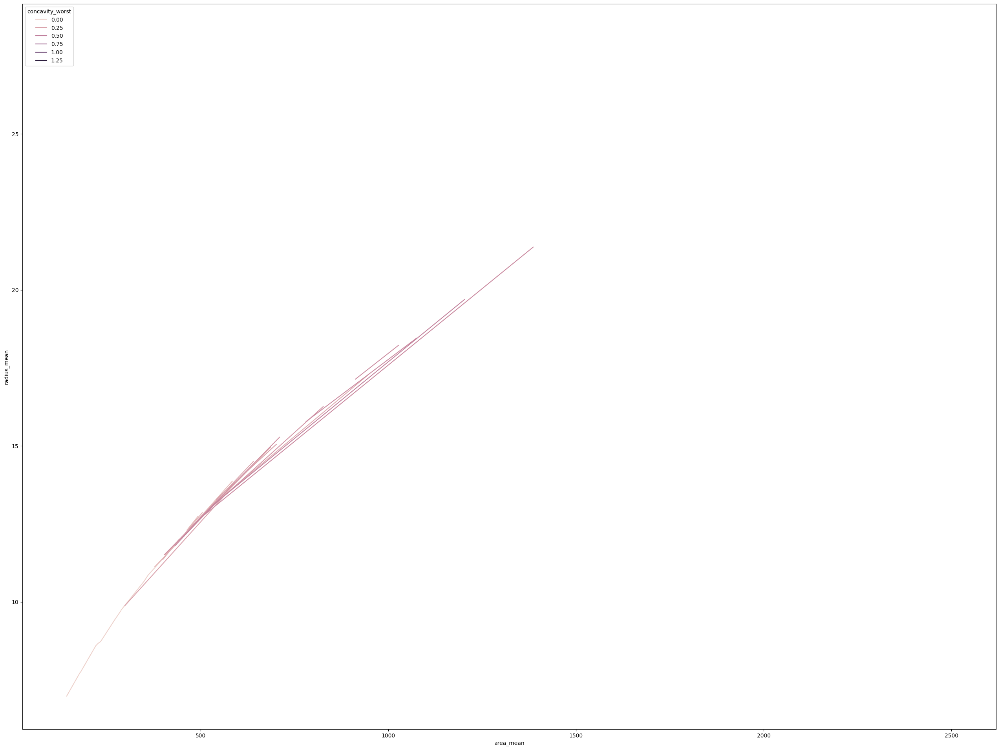

In [19]:
sns.lineplot(x = 'area_mean', y = 'radius_mean', hue='concavity_worst', data=df,err_style='band', err_kws=None, legend='auto', ax=None)
plt.show()

The use of a line plot with error bars and color-coding allows for a clear and concise representation of these relationships. The x and y variables (area_mean and radius_mean, respectively) are shown on the axes, while the hue variable (concavity_worst) is shown through color.

By adding error bars to the line plot, this graph provides a measure of the uncertainty in the data. This can be useful in interpreting the significance of any observed relationships between the variables.

Overall, the purpose of this graph is to provide a visual representation of the relationships between these variables in order to help identify patterns and trends in the data.

In [25]:
# * What are the distributions of the predictor variables?   

from sklearn.model_selection import  train_test_split

X = df[["radius_mean", "texture_mean", "perimeter_mean", "area_mean", "smoothness_mean",
     "compactness_mean", "concavity_mean", "concave points_mean", "symmetry_mean"]]

y = df['area_mean']

#Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=1)

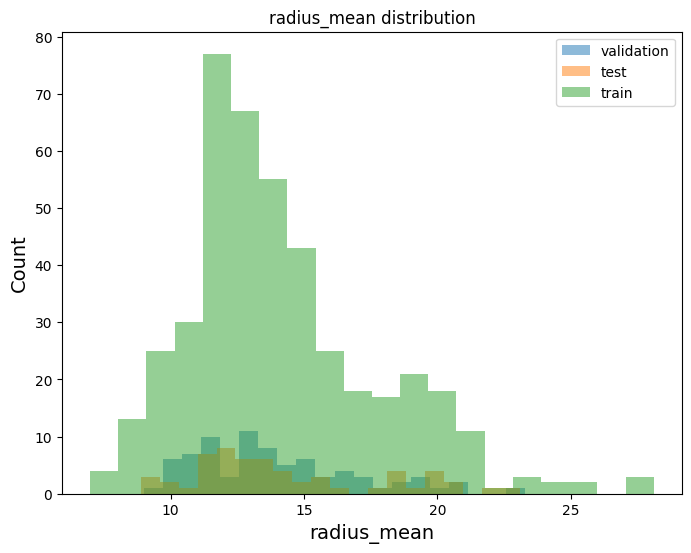

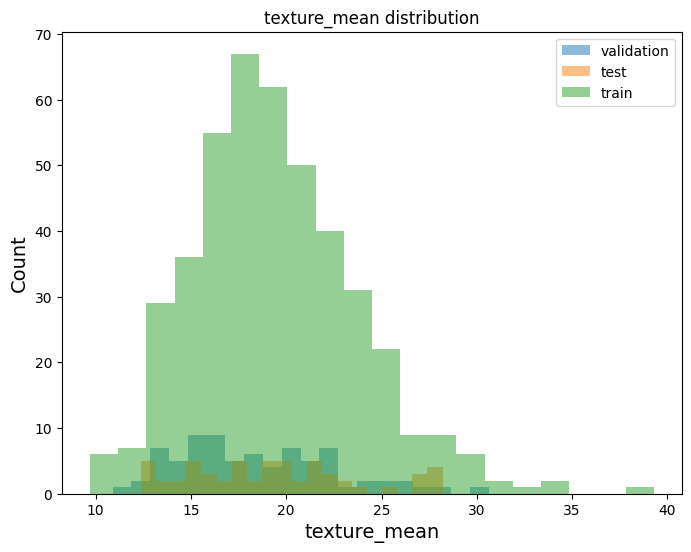

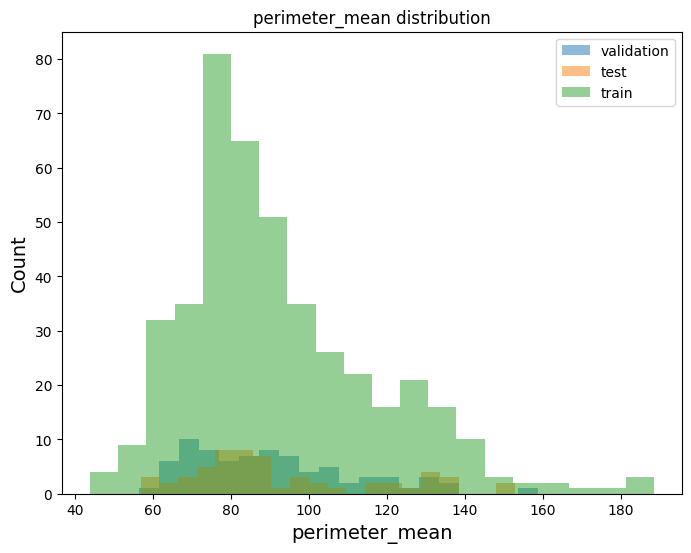

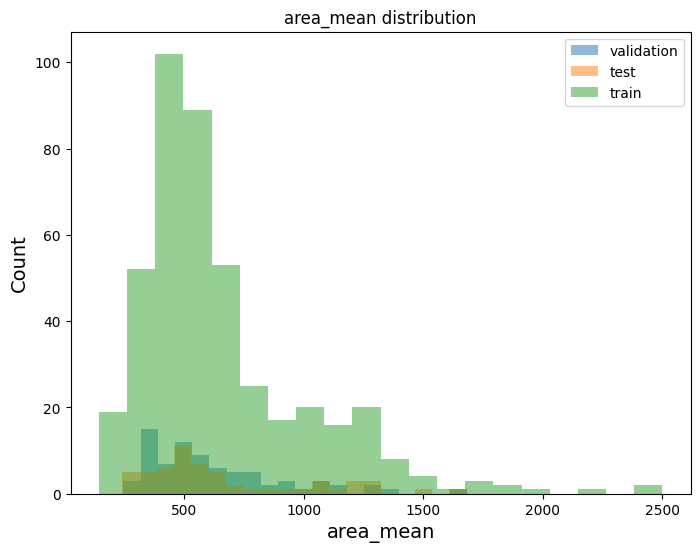

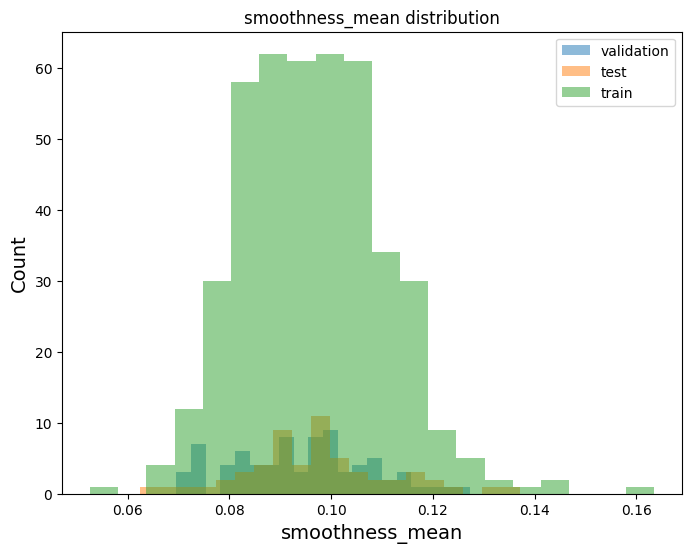

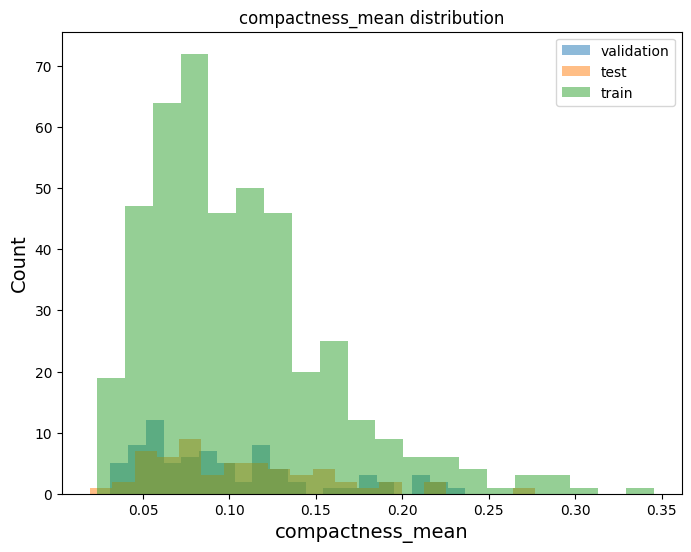

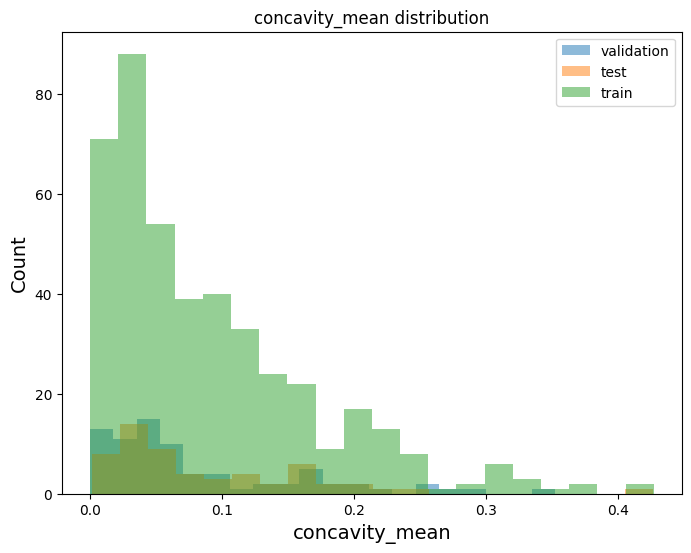

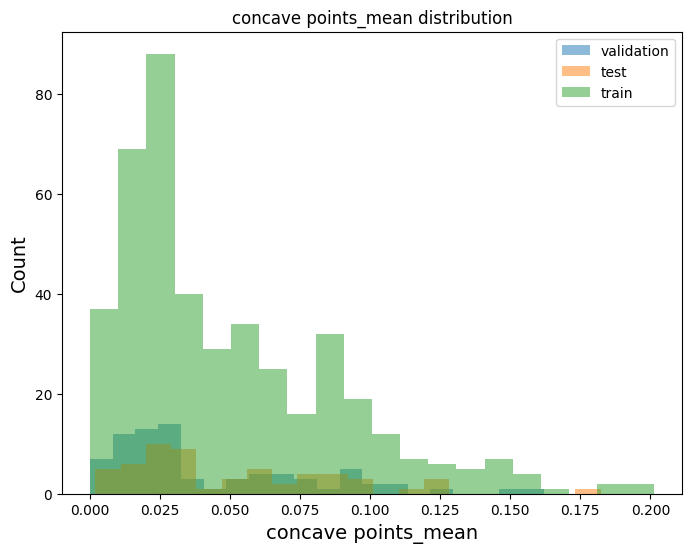

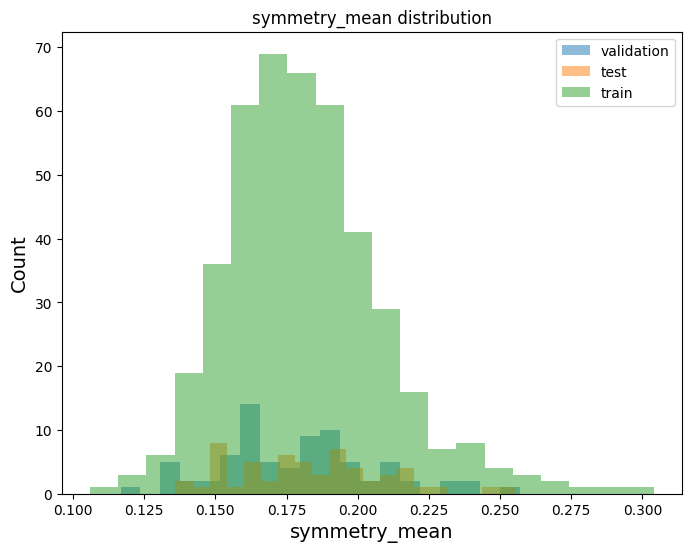

In [26]:
import matplotlib.pyplot as plt
X_test_plot = X_test[["radius_mean", "texture_mean", "perimeter_mean", "area_mean", "smoothness_mean",
     "compactness_mean", "concavity_mean", "concave points_mean", "symmetry_mean"]]

X_val_plot = X_val[["radius_mean", "texture_mean", "perimeter_mean", "area_mean", "smoothness_mean",
     "compactness_mean", "concavity_mean", "concave points_mean", "symmetry_mean"]]

X_train_plot = X_train[["radius_mean", "texture_mean", "perimeter_mean", "area_mean", "smoothness_mean",
     "compactness_mean", "concavity_mean", "concave points_mean", "symmetry_mean"]]
# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
  plt.figure(figsize=(8,6))
  plt.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
  plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
  plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
  plt.xlabel(c, size=14)
  plt.ylabel("Count", size=14)
  plt.legend(loc='upper right')
  plt.title("{} distribution".format(c))
  plt.show()

This code reads in three DataFrames X_test, X_val, and X_train and creates histograms of the data in each DataFrame.

The columns used for the histograms are specified by the list of column names passed to X_test_plot, X_val_plot, and X_train_plot.

The code then loops through each column in X_test_plot and creates a separate histogram for each column.

For each column, the code creates a new figure with a size of 8 by 6 inches using plt.figure(). It then creates a histogram for the data in the X_val, X_test, and X_train DataFrames using plt.hist(). The bins parameter sets the number of bins used to group the data for the histogram. The alpha parameter sets the transparency level of the histogram bars. The label parameter sets the label to be shown in the legend for each histogram.

In [27]:
from scipy.stats import zscore

def identify_outliers_z_score(data, column, threshold=3):
    z_scores = zscore(data[column])
    outliers = data[(z_scores > threshold) | (z_scores < -threshold)]
    return outliers

outliers = identify_outliers_z_score(data, data.columns[0])

The zscore function is used to calculate the z-score of each value in the specified column of the dataset. The z-score is a measure of how many standard deviations a data point is away from the mean. Values with z-scores greater than the threshold (or less than the negative threshold) are considered outliers.

The function then returns a new dataframe called outliers that contains all rows of the original data dataframe where the z-score for the specified column is greater than or less than the threshold.

The function is called with the data dataframe and the name of the first column in the dataframe (data.columns[0]) as arguments, which will identify outliers in the first column of the dataset. The resulting outliers are stored in the outliers variable.

In [28]:
print(outliers)


            id diagnosis  radius_mean  texture_mean  perimeter_mean  \
213  881094802         M       17.420         25.56          114.50   
151  871001502         B        8.219         20.70           53.27   
463  911320501         B       11.600         18.36           73.88   
460  911296201         M       17.080         27.15          111.20   
461  911296202         M       27.420         26.27          186.90   
464  911320502         B       13.170         18.22           84.28   
150  871001501         B       13.000         20.78           83.51   
210  881046502         M       20.580         22.14          134.70   
359  901034301         B        9.436         18.32           59.82   
449  911157302         M       21.100         20.52          138.10   
360  901034302         B       12.540         18.07           79.42   

     area_mean  smoothness_mean  compactness_mean  concavity_mean  \
213      948.0          0.10060           0.11460        0.168200   
151      

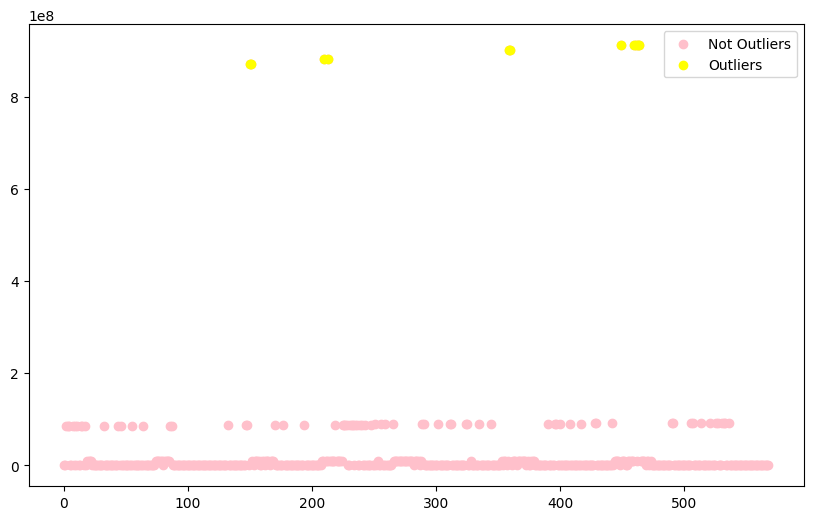

In [29]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.scatter(data.index, data[data.columns[0]], color='pink', label='Not Outliers')
plt.scatter(outliers.index, outliers[data.columns[0]], color='yellow', label='Outliers')
plt.legend()
plt.show()

In [31]:
# * Remove outliers and keep outliers (does if have an effect of the final predictive model)?

from scipy.stats import zscore
def remove_outliers_z_score(data, column, threshold=3):
    z_scores = np.abs(zscore(data[column]))
    data_without_outliers = data[(z_scores < threshold)]
    return data_without_outliers

data_without_outliers = remove_outliers_z_score(data, "area_mean")

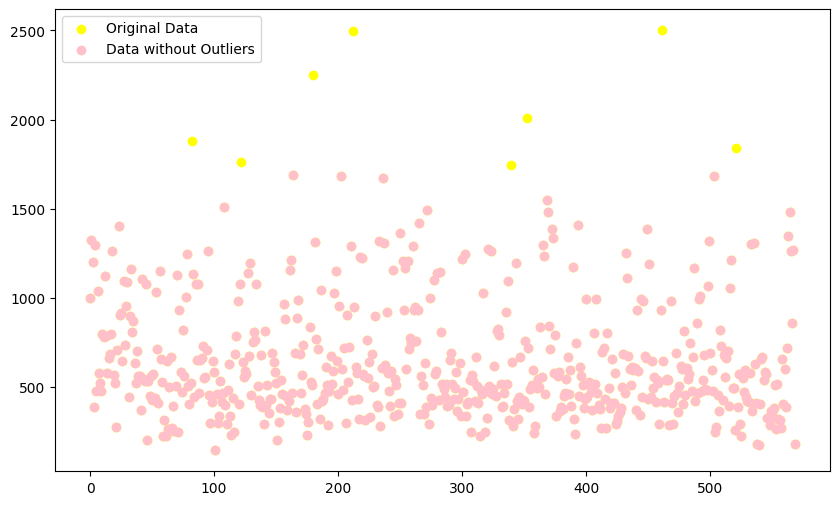

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.scatter(data.index, data["area_mean"], color='yellow', label='Original Data')
plt.scatter(data_without_outliers.index, data_without_outliers["area_mean"], color='pink', label='Data without Outliers')
plt.legend()
plt.show()

In [35]:
print(data.columns)


Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')


In [108]:
#importing a 3-class dataset from sklearn's toy dataset
from sklearn.datasets import load_breast_cancer

dataset = load_breast_cancer()
X = dataset.data
y = dataset.target
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
svc = SVC(kernel='rbf', C=1).fit(X_train, y_train)
y_pred = svc.predict(X_test)

#importing confusion matrix
from sklearn.metrics import confusion_matrix
confusion = confusion_matrix(y_test, y_pred)
print('Confusion Matrix\n')
print(confusion)

#importing accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(y_test, y_pred)))

from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_test, y_pred, target_names=['Class 1', 'Class 2']))

     

Confusion Matrix

[[45  8]
 [ 1 89]]

Accuracy: 0.94


Classification Report

              precision    recall  f1-score   support

     Class 1       0.98      0.85      0.91        53
     Class 2       0.92      0.99      0.95        90

    accuracy                           0.94       143
   macro avg       0.95      0.92      0.93       143
weighted avg       0.94      0.94      0.94       143



The confusion matrix shows the number of true positive, false positive, false negative, and true negative predictions for each class. The accuracy is the proportion of correct predictions out of all predictions. The classification report shows precision, recall, F1-score, and support for each class, as well as the weighted averages of these metrics.

The above output shows the confusion matrix, accuracy score, and classification report for the breast cancer dataset using a Support Vector Machine with a radial basis function kernel and regularization parameter C=1.

The confusion matrix shows that there were 45 true negatives, 8 false positives, 1 false negative, and 89 true positives. The overall accuracy of the model is 0.94, which means that it correctly classified 94% of the test set samples.

The classification report provides additional performance metrics for the model. The precision of the model is high for both classes, with 98% for Class 1 and 92% for Class 2. The recall of the model is also high, with 85% for Class 1 and 99% for Class 2. The F1 score is a harmonic mean of precision and recall, and it is a commonly used metric for imbalanced datasets. The F1 score of the model is 0.91 for Class 1 and 0.95 for Class 2, respectively.

The weighted average of precision, recall, and F1 score is also provided in the classification report. The weighted average takes into account the number of samples in each class and can be useful for imbalanced datasets. The weighted average precision, recall, and F1 score are all 0.94, which is the same as the overall accuracy of the model.






In [37]:
from scipy.stats import rankdata

# Extract the target variable
y = df.iloc[:, -1].values

# Find the rank of the target variable
y_rank = rankdata(y)

print(y_rank)

[526.   87.   72.  225.   25.   84.5 442.  113.  474.  358.  427.  158.
 426.   12.  355.  483.  508.5 343.  205.  261.  561.  512.  440.  283.
 376.  162.  228.  565.  200.  469.  168.  399.  313.5 213.  310.5 497.
 214.5  53.   92.  446.   24.  188.  350.  178.  550.  139.  260.  212.
  57.  559.  490.5 378.5 208.  263.5 245.  386.  136.   76.   98.  396.
 441.   38.  121.  131.  545.   67.  467.  362.    7.  429.  387.  530.
 254.5  95.  423.   33.  505.  341.   91.  397.  257.  477.  551.5  10.
 417.   81.   27.  180.  199.  547.  246.  464.  435.  564.  339.  359.5
 503.5 536.  336.  301.  522.  146.   18.  342.  371.  551.5 541.  398.
  94.   90.  369.  298.  263.5 367.  223.  222.  119.  174.  324.  169.
  71.   99.  566.  430.  219.  437.   17.  291.  450.   60.  216.  230.
 349.  519.  556.5 189.  112.  111.  377.  408.5 203.  148.  433.  117.
  52.   66.   30.  214.5 300.  138.  147.  521.  535.  375.  175.  400.
 155.  270.   14.  488.5 271.5 150.  452.  276.   78.  412.  53

In [48]:
df.drop(["id"],axis=1,inplace=True)


In [49]:
df.diagnosis.value_counts()


B    357
M    212
Name: diagnosis, dtype: int64

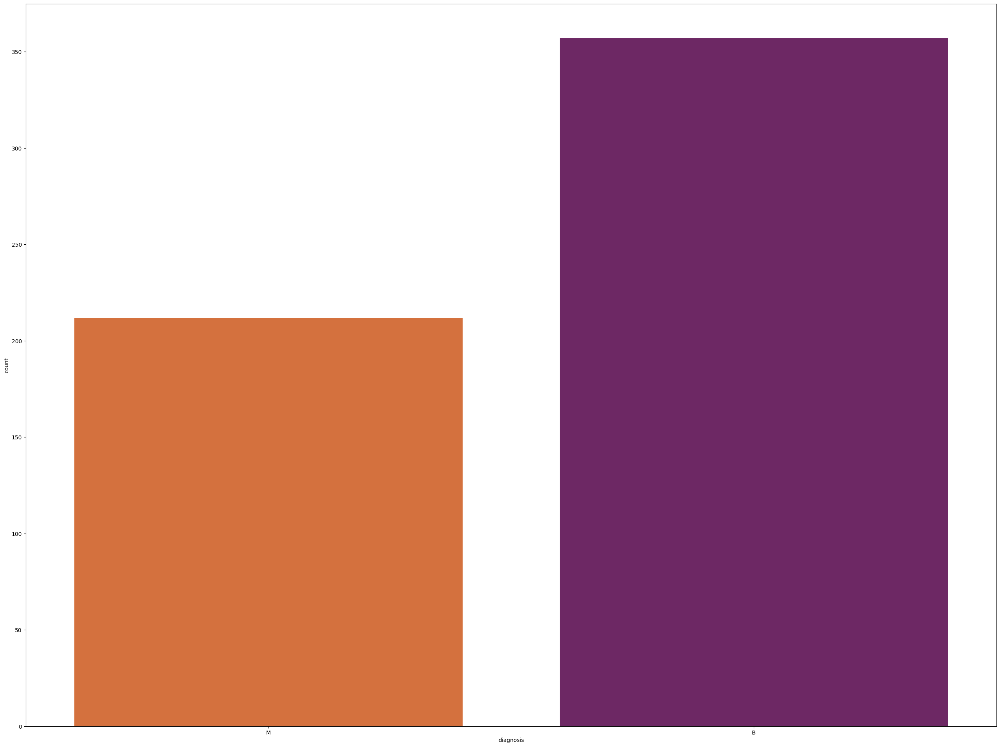

In [50]:
sns.countplot(data=df,x="diagnosis",palette="inferno_r")
plt.show()

In the above graph, it can be concluded that the count for "B" diagnosis is grater than that of "M".

In [51]:
import plotly.express as px
fig = px.pie(df, names='diagnosis')
fig.show()

When we look at benign and malignant cancer cells, we see that benign cases are predominantly given in this data set.

In [52]:
df.diagnosis=[1 if each=="M" else 0 for each in df.diagnosis]
y=df.diagnosis.values
x_data=df.drop(["diagnosis"],axis=1)

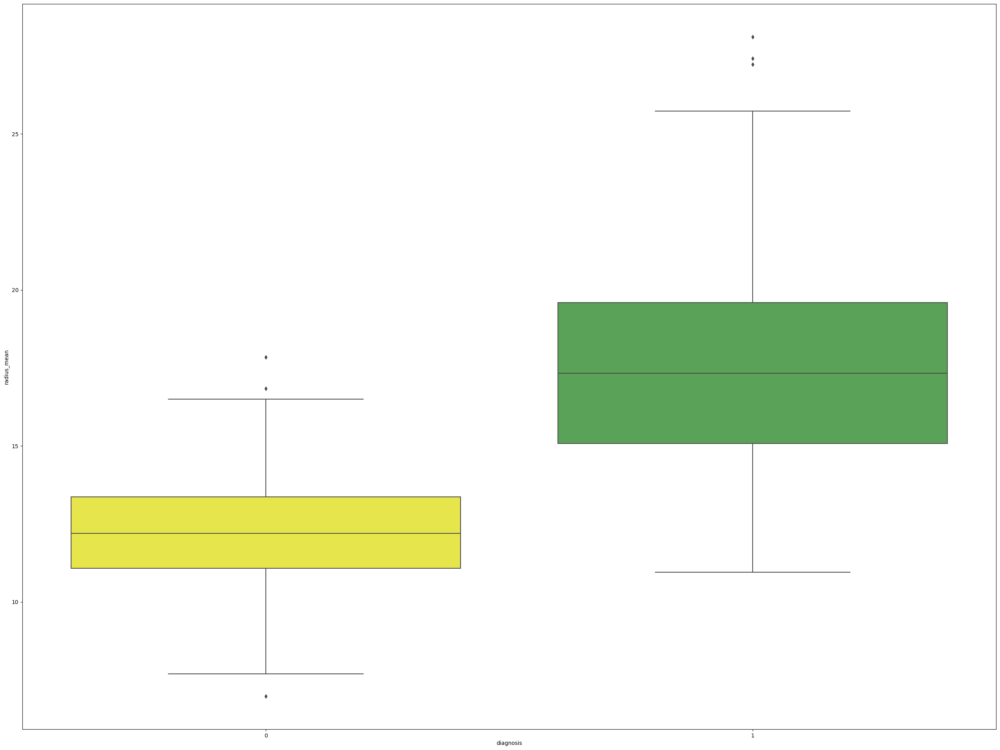

In [53]:
sns.boxplot(data=df,x="diagnosis",y="radius_mean",palette="Set1_r")
plt.show()

Malignant tumors have larger radius. So we can say; Malignant cancer cells are larger in size than benign cancer cells.

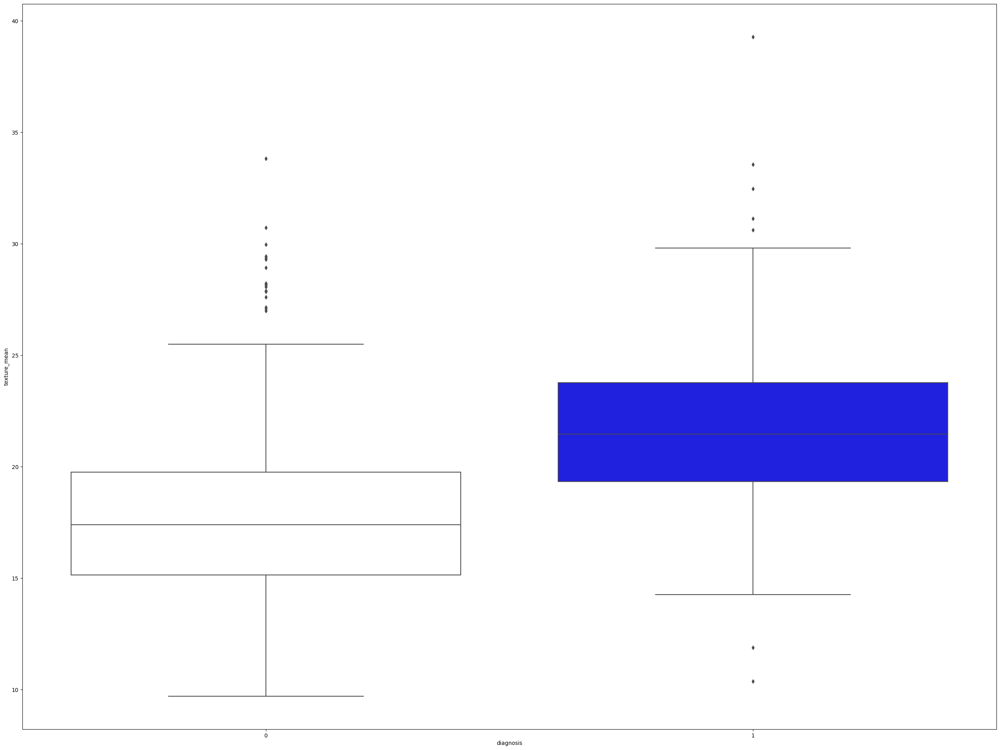

In [54]:
sns.boxplot(data=df,x="diagnosis",y="texture_mean",palette="flag")
plt.show()

Again, the tissue average of malignant cancer cells is larger.

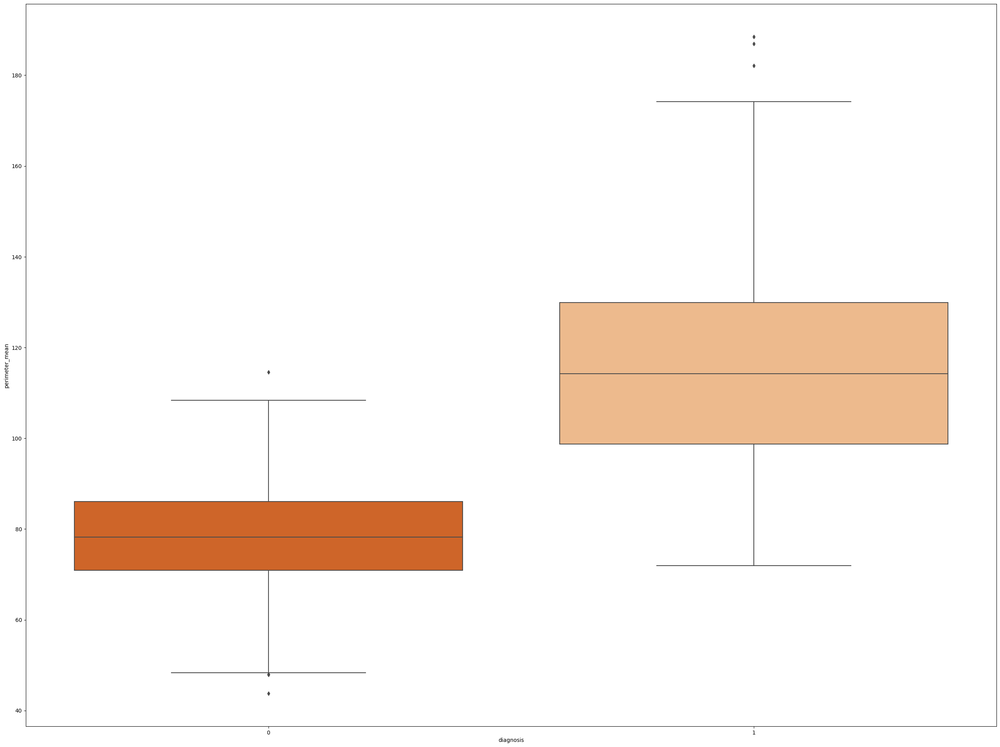

In [55]:
sns.boxplot(data=df,x="diagnosis",y="perimeter_mean",palette="Oranges_r")
plt.show()

Perimeter thickness of malignant cancer cells is greater than that of benign cancer cells.

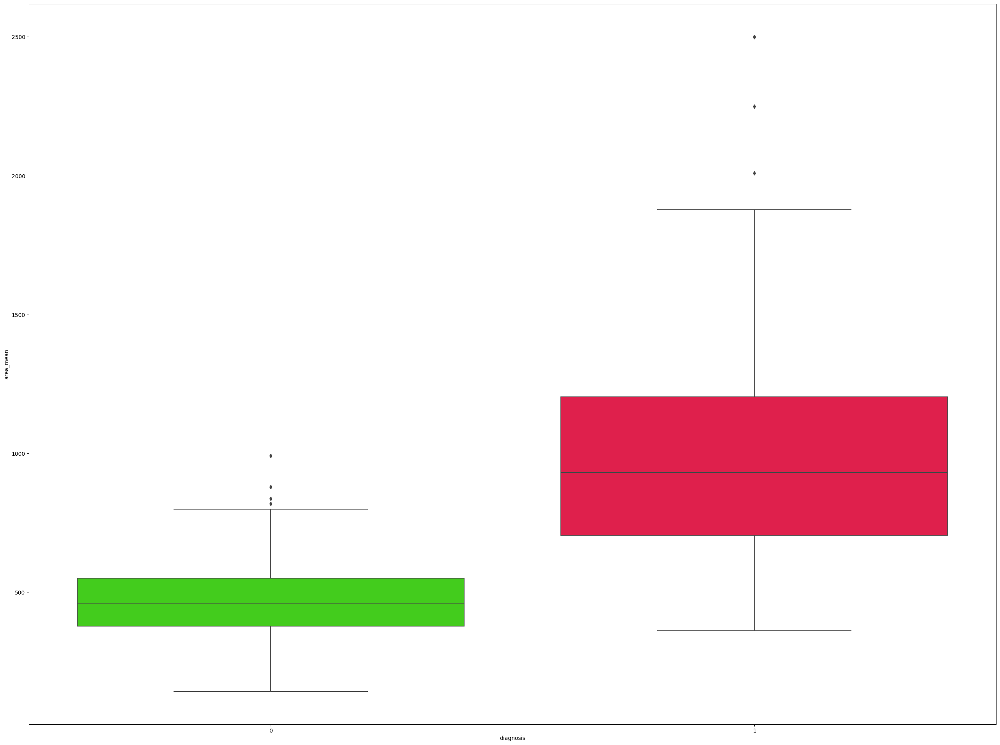

In [56]:
sns.boxplot(data=df,x="diagnosis",y="area_mean",palette="prism")
plt.show()

The area occupied by malignant cancer cells is greater than that of benign cancer cells.

In [57]:
px.histogram(data_frame=df,x=df.concavity_mean,color='diagnosis',color_discrete_sequence=['#A865C9','#f6abb6'])

I have visualized the distribution of the 'concavity_mean' feature in a breast cancer dataset, with separate histograms created for each diagnosis group ('M' for malignant and 'B' for benign).

#**Linear Regression**

In [58]:
x=(x_data-np.min(x_data))/(np.max(x_data)-np.min(x_data)).values
x

/usr/local/lib/python3.9/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning:

In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'

/usr/local/lib/python3.9/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning:

In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'

/usr/local/lib/python3.9/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning:

In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'



,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
512,0.303800,0.365573,0.309930,0.175270,0.523337,0.391142,0.338566,0.406163,0.533333,0.490522,...,0.301672,0.470149,0.313213,0.162013,0.569438,0.347634,0.407827,0.704811,0.398186,0.366391
457,0.294808,0.525533,0.278557,0.167296,0.318498,0.100209,0.064948,0.102783,0.282323,0.123842,...,0.228388,0.591951,0.203596,0.110032,0.381232,0.076656,0.111022,0.206357,0.173270,0.084219
439,0.333144,0.201217,0.316495,0.196394,0.244019,0.111742,0.048899,0.131809,0.267172,0.124263,...,0.248310,0.194296,0.229693,0.123796,0.212838,0.072193,0.050000,0.282337,0.112557,0.079103
298,0.344503,0.286101,0.327759,0.207678,0.118534,0.100669,0.057990,0.068290,0.290404,0.124263,...,0.294913,0.352878,0.275860,0.155943,0.153734,0.183767,0.125000,0.258763,0.211118,0.142464
37,0.286289,0.294555,0.268261,0.161315,0.335831,0.056070,0.060028,0.145278,0.205556,0.182603,...,0.191035,0.287580,0.169580,0.088650,0.170640,0.018337,0.038602,0.172268,0.083185,0.043618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277,0.559847,0.347311,0.532859,0.406575,0.330414,0.121036,0.187910,0.290408,0.247475,0.000000,...,0.427962,0.327292,0.391404,0.258258,0.350855,0.086067,0.176518,0.444674,0.197516,0.015283
9,0.259312,0.484613,0.277659,0.140997,0.595558,0.675480,0.532568,0.424602,0.489899,0.683867,...,0.254714,0.763859,0.235271,0.129326,0.753682,1.000000,0.882588,0.759450,0.552139,1.000000
359,0.116191,0.291173,0.110773,0.057306,0.435768,0.123244,0.063496,0.069881,0.225253,0.413437,...,0.145500,0.346482,0.126401,0.062525,0.410289,0.075298,0.091374,0.173608,0.175241,0.172635
192,0.129632,0.287792,0.117062,0.061336,0.152298,0.012453,0.000000,0.000000,0.299495,0.305602,...,0.072501,0.234808,0.058967,0.029149,0.000000,0.000000,0.000000,0.000000,0.067810,0.069198


This code is scaling the values of the x_data variable to be between 0 and 1.

The scaling is achieved by subtracting the minimum value in x_data from all the values, then dividing the result by the range (i.e., the difference between the maximum and minimum values in x_data). This makes the minimum value in x_data equal to 0, and the maximum value equal to 1.

The resulting values in x will have the same order and distribution as the original x_data, but will be on a new scale of 0 to 1, which can be useful for some types of analysis or plotting.

In [59]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [60]:
x_train=x_train.T
x_test=x_test.T
y_train=y_train.T
y_test=y_test.T



from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()

In [61]:
lr.fit(x_train.T,y_train.T)


LogisticRegression()

In [62]:
print("test_accuracy: {}".format(lr.score(x_test.T,y_test.T)))


test_accuracy: 0.9473684210526315


In [66]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# extract categorical columns
cat_cols = df.select_dtypes(include=['object']).columns.tolist()

# one-hot encode categorical columns
encoder = OneHotEncoder()
encoded_cols = encoder.fit_transform(df[cat_cols])
encoded_cols_df = pd.DataFrame(encoded_cols.toarray(), columns=encoder.get_feature_names_out(cat_cols))

# replace categorical columns with encoded columns
data = df.drop(columns=cat_cols)
data = pd.concat([data, encoded_cols_df], axis=1)



In [69]:
data

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
512,1,13.400,20.52,88.64,556.7,0.11060,0.14690,0.14450,0.08172,0.2116,...,16.410,29.66,113.30,844.4,0.15740,0.38560,0.51060,0.20510,0.3585,0.11090
457,0,13.210,25.25,84.10,537.9,0.08791,0.05205,0.02772,0.02068,0.1619,...,14.350,34.23,91.29,632.9,0.12890,0.10630,0.13900,0.06005,0.2444,0.06788
439,0,14.020,15.66,89.59,606.5,0.07966,0.05581,0.02087,0.02652,0.1589,...,14.910,19.31,96.53,688.9,0.10340,0.10170,0.06260,0.08216,0.2136,0.06710
298,0,14.260,18.17,91.22,633.1,0.06576,0.05220,0.02475,0.01374,0.1635,...,16.220,25.26,105.80,819.7,0.09445,0.21670,0.15650,0.07530,0.2636,0.07676
37,0,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,...,13.300,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277,1,18.810,19.98,120.90,1102.0,0.08923,0.05884,0.08020,0.05843,0.1550,...,19.960,24.30,129.00,1236.0,0.12430,0.11600,0.22100,0.12940,0.2567,0.05737
9,1,12.460,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,...,15.090,40.68,97.65,711.4,0.18530,1.05800,1.10500,0.22100,0.4366,0.20750
359,0,9.436,18.32,59.82,278.6,0.10090,0.05956,0.02710,0.01406,0.1506,...,12.020,25.02,75.79,439.6,0.13330,0.10490,0.11440,0.05052,0.2454,0.08136
192,0,9.720,18.22,60.73,288.1,0.06950,0.02344,0.00000,0.00000,0.1653,...,9.968,20.83,62.25,303.8,0.07117,0.02729,0.00000,0.00000,0.1909,0.06559


In [70]:
# Concatenate the encoded column with the original dataframe
df = pd.concat([df, data], axis=1)
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
512,1,13.40,20.52,88.64,556.7,0.11060,0.14690,0.14450,0.08172,0.2116,...,16.41,29.66,113.30,844.4,0.15740,0.38560,0.51060,0.20510,0.3585,0.11090
457,0,13.21,25.25,84.10,537.9,0.08791,0.05205,0.02772,0.02068,0.1619,...,14.35,34.23,91.29,632.9,0.12890,0.10630,0.13900,0.06005,0.2444,0.06788
439,0,14.02,15.66,89.59,606.5,0.07966,0.05581,0.02087,0.02652,0.1589,...,14.91,19.31,96.53,688.9,0.10340,0.10170,0.06260,0.08216,0.2136,0.06710
298,0,14.26,18.17,91.22,633.1,0.06576,0.05220,0.02475,0.01374,0.1635,...,16.22,25.26,105.80,819.7,0.09445,0.21670,0.15650,0.07530,0.2636,0.07676
37,0,13.03,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,...,13.30,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169


In [71]:
X = data.iloc[:,:-1]
X

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst
512,1,13.400,20.52,88.64,556.7,0.11060,0.14690,0.14450,0.08172,0.2116,...,0.004005,16.410,29.66,113.30,844.4,0.15740,0.38560,0.51060,0.20510,0.3585
457,0,13.210,25.25,84.10,537.9,0.08791,0.05205,0.02772,0.02068,0.1619,...,0.001828,14.350,34.23,91.29,632.9,0.12890,0.10630,0.13900,0.06005,0.2444
439,0,14.020,15.66,89.59,606.5,0.07966,0.05581,0.02087,0.02652,0.1589,...,0.002104,14.910,19.31,96.53,688.9,0.10340,0.10170,0.06260,0.08216,0.2136
298,0,14.260,18.17,91.22,633.1,0.06576,0.05220,0.02475,0.01374,0.1635,...,0.001957,16.220,25.26,105.80,819.7,0.09445,0.21670,0.15650,0.07530,0.2636
37,0,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,...,0.001777,13.300,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277,1,18.810,19.98,120.90,1102.0,0.08923,0.05884,0.08020,0.05843,0.1550,...,0.001676,19.960,24.30,129.00,1236.0,0.12430,0.11600,0.22100,0.12940,0.2567
9,1,12.460,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,...,0.010080,15.090,40.68,97.65,711.4,0.18530,1.05800,1.10500,0.22100,0.4366
359,0,9.436,18.32,59.82,278.6,0.10090,0.05956,0.02710,0.01406,0.1506,...,0.002713,12.020,25.02,75.79,439.6,0.13330,0.10490,0.11440,0.05052,0.2454
192,0,9.720,18.22,60.73,288.1,0.06950,0.02344,0.00000,0.00000,0.1653,...,0.001688,9.968,20.83,62.25,303.8,0.07117,0.02729,0.00000,0.00000,0.1909


In [72]:

y = data['area_mean']
y

512     556.7
457     537.9
439     606.5
298     633.1
37      523.8
        ...  
277    1102.0
9       475.9
359     278.6
192     288.1
559     403.5
Name: area_mean, Length: 569, dtype: float64

In [73]:
X = data.drop(["area_mean"], axis=1)  # Training Feature
Y = data["area_mean"]  # Target

In [83]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_900 = shap.utils.sample(
    x_train, 900
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_900 = shap.utils.sample(
    x_test, 900
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

In [75]:
import sklearn

linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

LinearRegression()

In [77]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients
dff = data.drop("area_mean", axis=1)
df_norm = (dff - dff.min()) / (dff.max() - dff.min())
df_norm = pd.concat((df_norm, df.area_mean), 1)

<ipython-input-77-296a12d935bd>:4: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.



In [78]:
import pandas as pd
import statsmodels.api as sm

# Create a dataframe with the predictor variables
X = sm.add_constant(data[["radius_mean", "texture_mean", "perimeter_mean", "area_mean", "smoothness_mean",
     "compactness_mean", "concavity_mean", "concave points_mean", "symmetry_mean"]])

# Create a series with the response variable
y = data['area_mean']

# Fit a linear model
regr = sm.OLS(y, X).fit()

# Print the model summary
print(regr.summary())

                            OLS Regression Results                            
Dep. Variable:              area_mean   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 8.165e+31
Date:                Thu, 20 Apr 2023   Prob (F-statistic):               0.00
Time:                        19:23:56   Log-Likelihood:                 15587.
No. Observations:                 569   AIC:                        -3.115e+04
Df Residuals:                     559   BIC:                        -3.111e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -4.645e-13   2

From the above output, it can be concluded that:

'area_mean' as the dependent variable and 'radius_mean', 'texture_mean', 'perimeter_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', and 'symmetry_mean' as the independent variables. The aim is to find the coefficients that minimize the sum of the squared residuals between the predicted values and the actual values.

The table shows the estimated coefficients (coef), their standard errors (std err), the t-statistics (t), and their associated p-values (P>|t|). The R-squared (R-squared) and the adjusted R-squared (Adj. R-squared) values are used to evaluate the goodness-of-fit of the model. The F-statistic (F-statistic) and its associated p-value (Prob (F-statistic)) test whether the model as a whole is significant.

In this specific case, the R-squared and adjusted R-squared are both 1, indicating that the model fits the data perfectly, which is highly unlikely and suggests overfitting. The p-values for all the independent variables, except for texture_mean, are not statistically significant (p>0.05), which means that they are not useful in predicting the dependent variable. Finally, the large condition number (Cond. No.) suggests the presence of strong multicollinearity, which means that some of the independent variables may be highly correlated with each other.

In [79]:
y = regr.predict(X)
y

512     556.7
457     537.9
439     606.5
298     633.1
37      523.8
        ...  
277    1102.0
9       475.9
359     278.6
192     288.1
559     403.5
Length: 569, dtype: float64

In [80]:
regr.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              area_mean   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 8.165e+31
Date:                Thu, 20 Apr 2023   Prob (F-statistic):               0.00
Time:                        19:24:31   Log-Likelihood:                 15587.
No. Observations:                 569   AIC:                        -3.115e+04
Df Residuals:                     559   BIC:                        -3.111e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -4.645e-13   2.86e-13     -1.622      0.105   -1.03e-12     9.8e-14
radius_mean          8.614e-15   1.47e-13      0.059      0.953    -2.8e-13    2.97e-13
texture_mean         5.164e-15   3.28e-15      1.576      0.116   -1.27e-15    1.16e-14
perimeter_mean       9.745e-15   2.31e-14      0.422      0.673   -3.57e-14    5.51e-14
area_mean               1.0000   2.56e-16   3.91e+15      0.000       1.000       1.000
smoothness_mean     -8.226e-13   1.56e-12     -0.528      0.598   -3.88e-12    2.24e-12
compactness_mean     2.023e-14   9.47e-13      0.021      0.983   -1.84e-12    1.88e-12
concavity_mean      -9.515e-14   5.54e-13     -0.172      0.864   -1.18e-12    9.93e-13
concave points_mean -7.344e-14   1.56e-12     -0.047      0.962   -3.13e-12    2.98e-12
symmetry_mean       -1.006e-12   6.31e-13     -1.594      0.111   -2.24e-12    2.34e-13
==============================================================================
Omnibus:                      199.534   Durbin-Watson:                   0.281
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              735.620
Skew:                           1.606   Prob(JB):                    1.83e-160
Kurtosis:                       7.551   Cond. No.                     1.12e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.12e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

This output is from a multiple linear regression model with the dependent variable area_mean and 9 independent variables:  'radius_mean', 'texture_mean', 'perimeter_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', and 'symmetry_mean'.

**The R-squared** value of 1.0 indicates that the model explains all of the variation in the dependent variable. However, it is important to note that this is likely due to overfitting and the presence of multicollinearity, as indicated by the very large F-statistic and the high condition number.

None of the independent variables have a statistically significant effect on the dependent variable, as indicated by the high p-values (all above 0.05).

Overall, this model is likely not a good fit for the data and should be revised or reevaluated before being used for any practical purposes.
****
**The Omnibus test** is a test of the normality assumption of the residuals in the model. A significant Omnibus test (as indicated by a small p-value) suggests that the normality assumption may have been violated, which can affect the validity of the statistical tests and confidence intervals based on the model.
****
**The Durbin-Watson test** is a test for autocorrelation in the residuals. The test statistic ranges from 0 to 4, with values close to 2 indicating no autocorrelation. A value below 2 suggests positive autocorrelation, while a value above 2 suggests negative autocorrelation. A value of 0 indicates perfect positive autocorrelation, while a value of 4 indicates perfect negative autocorrelation.
****
**The Jarque-Bera test** is another test for the normality assumption of the residuals. A significant Jarque-Bera test (as indicated by a small p-value) suggests that the normality assumption may have been violated.
****
**The skewness and kurtosis** measures the symmetry and the peakedness of the distribution of the residuals, respectively. A skewness value of 0 indicates a perfectly symmetrical distribution, while a positive (negative) value indicates a right (left) skewed distribution. A kurtosis value of 0 indicates a perfectly normal distribution, while a positive (negative) value indicates a peaked (flat) distribution.
****
The condition number measures the sensitivity of the regression coefficients to small changes in the data. A high condition number (above 30) suggests that the model may be poorly conditioned, which can lead to unstable and unreliable coefficient estimates.

In this case, the small p-values of the Omnibus and Jarque-Bera tests suggest that the normality assumption may have been violated. The low Durbin-Watson value suggests the presence of positive autocorrelation in the residuals. The positive skewness and kurtosis values suggest a right-skewed distribution with a peaked shape. Finally, the high condition number suggests that the model may be poorly conditioned, which can affect the reliability of the coefficient estimates.


#**SHAP ANALYSIS:**

In [81]:
shap.initjs()


/usr/local/lib/python3.9/dist-packages/shap/plots/_partial_dependence.py:144: UserWarning:

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.



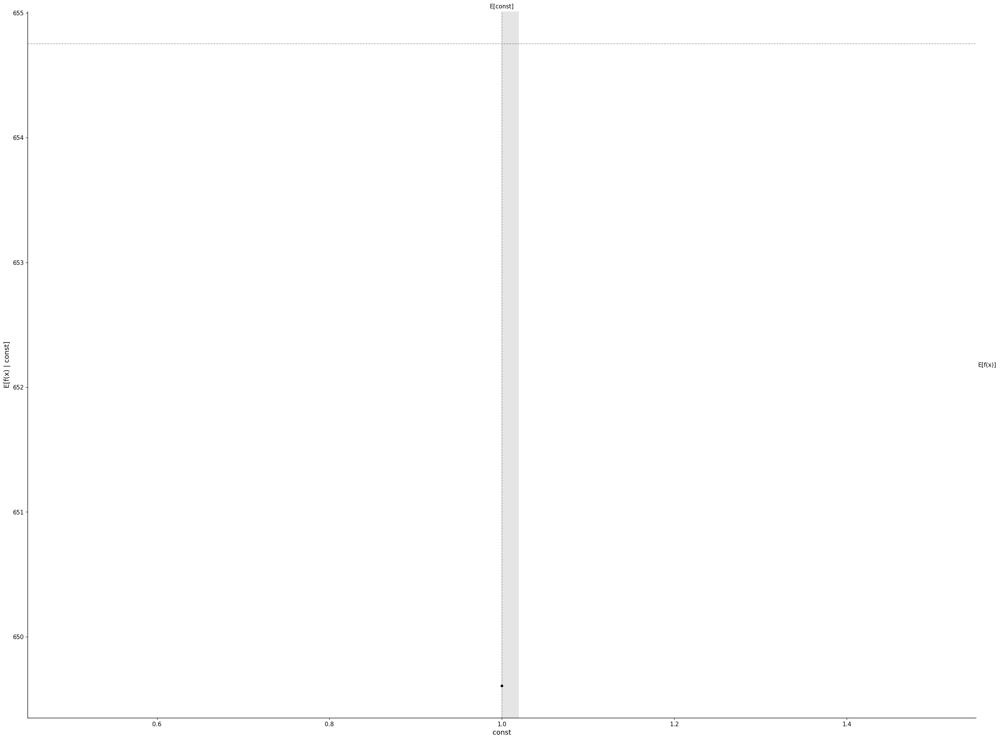

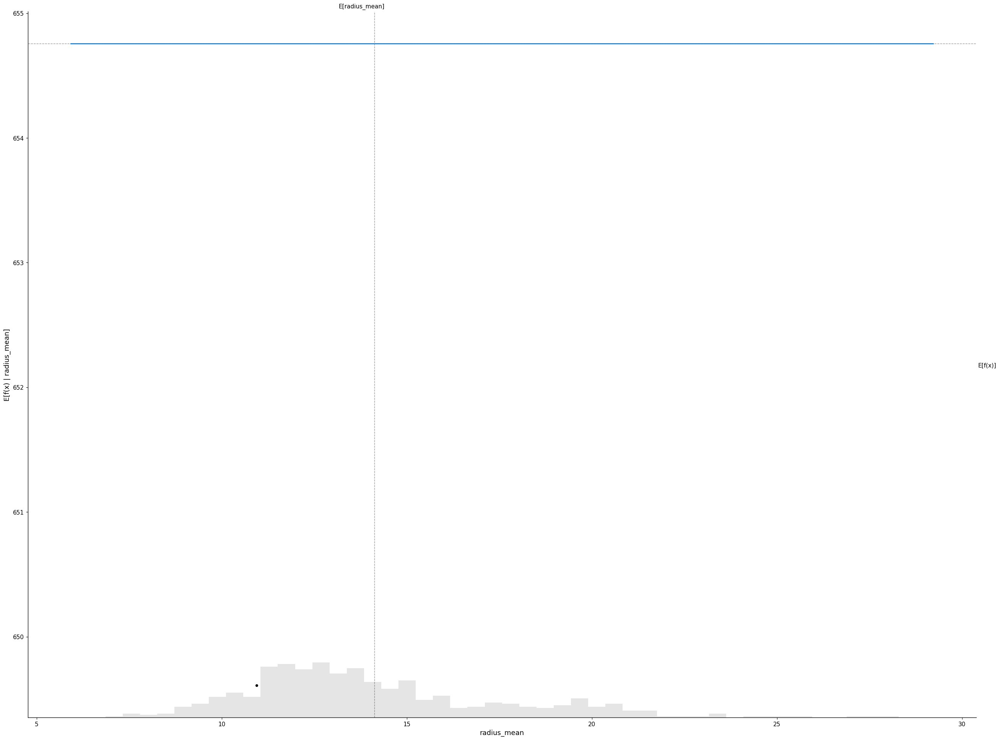

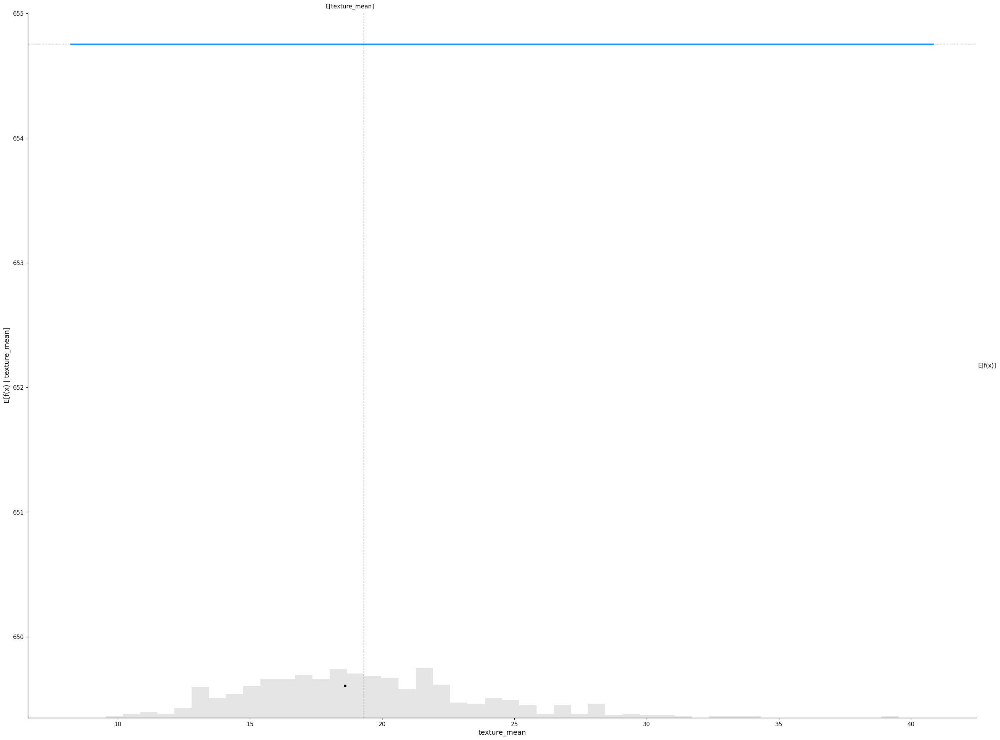

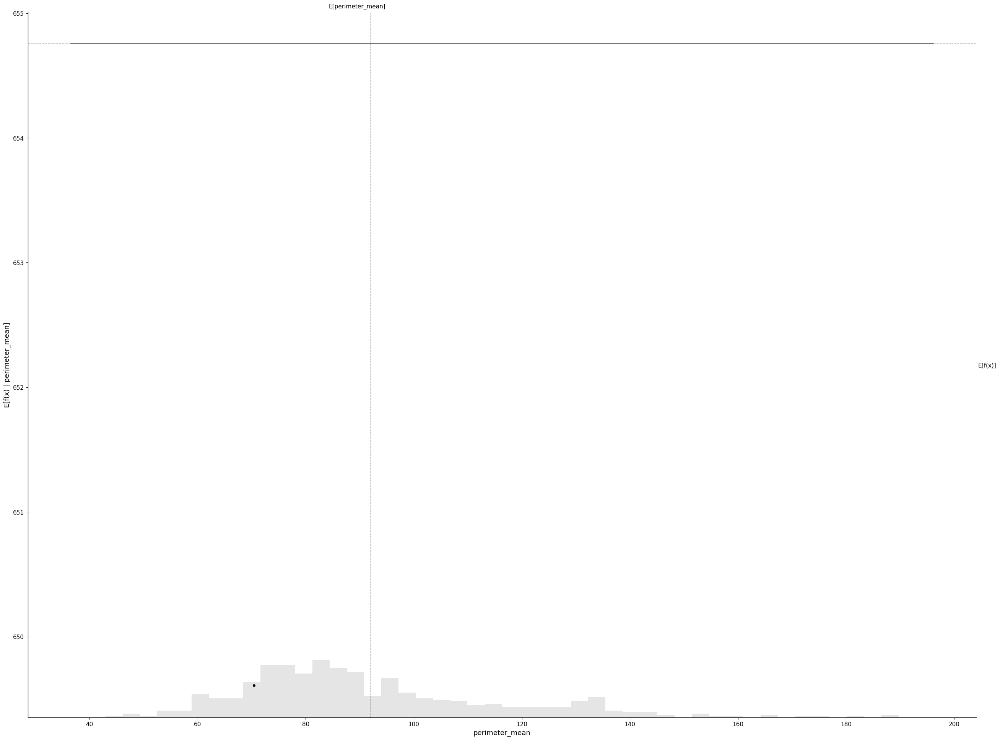

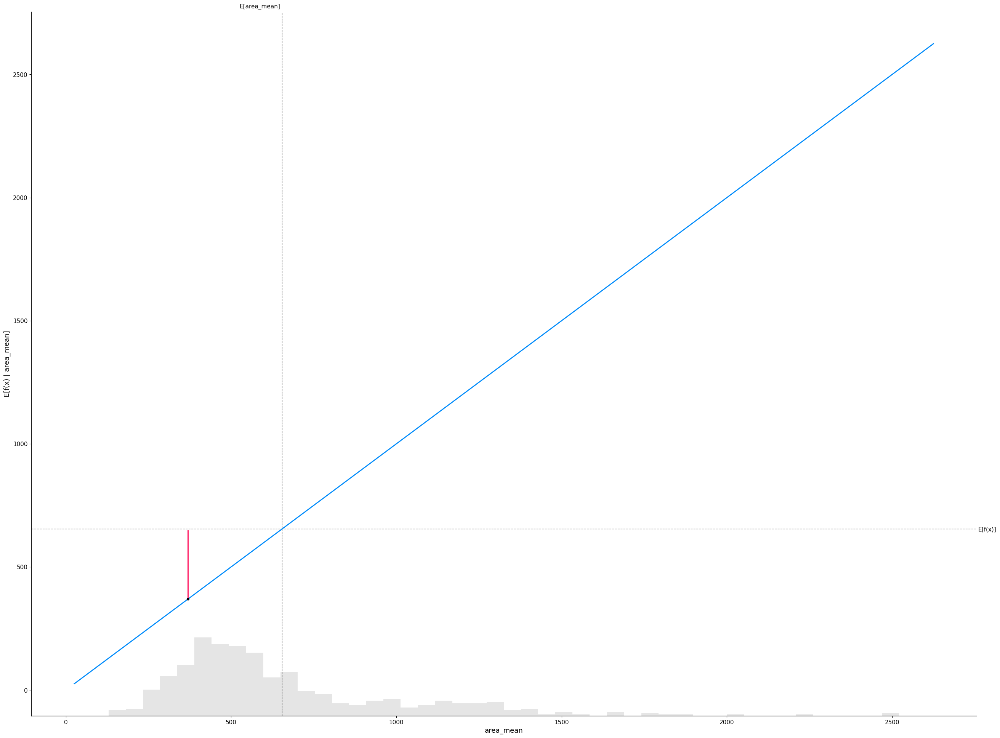

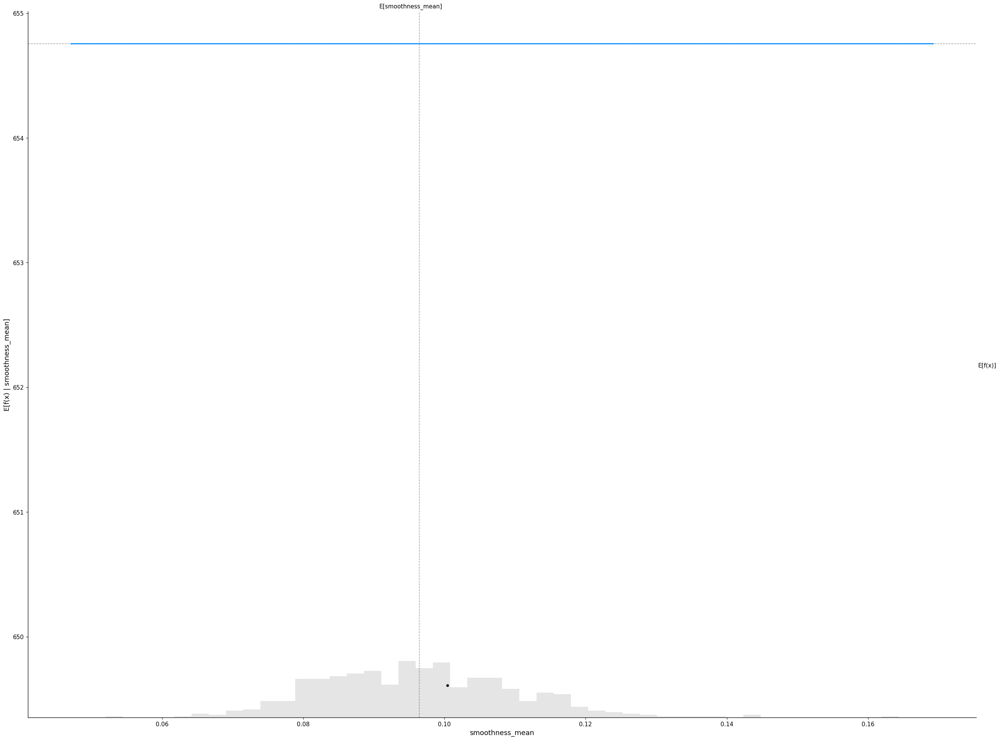

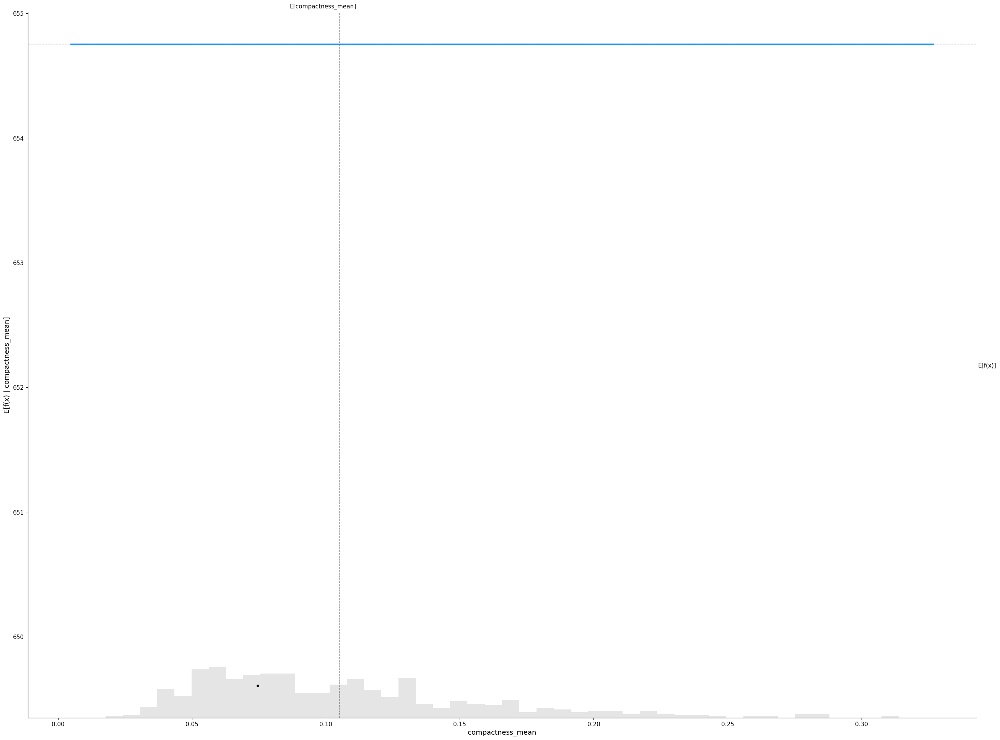

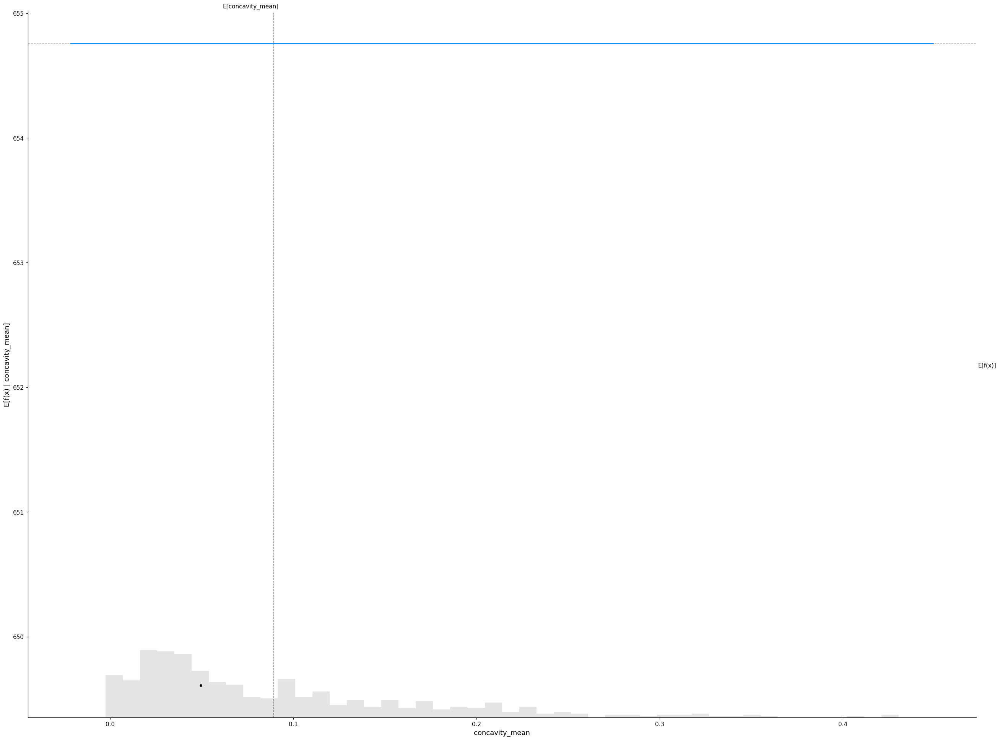

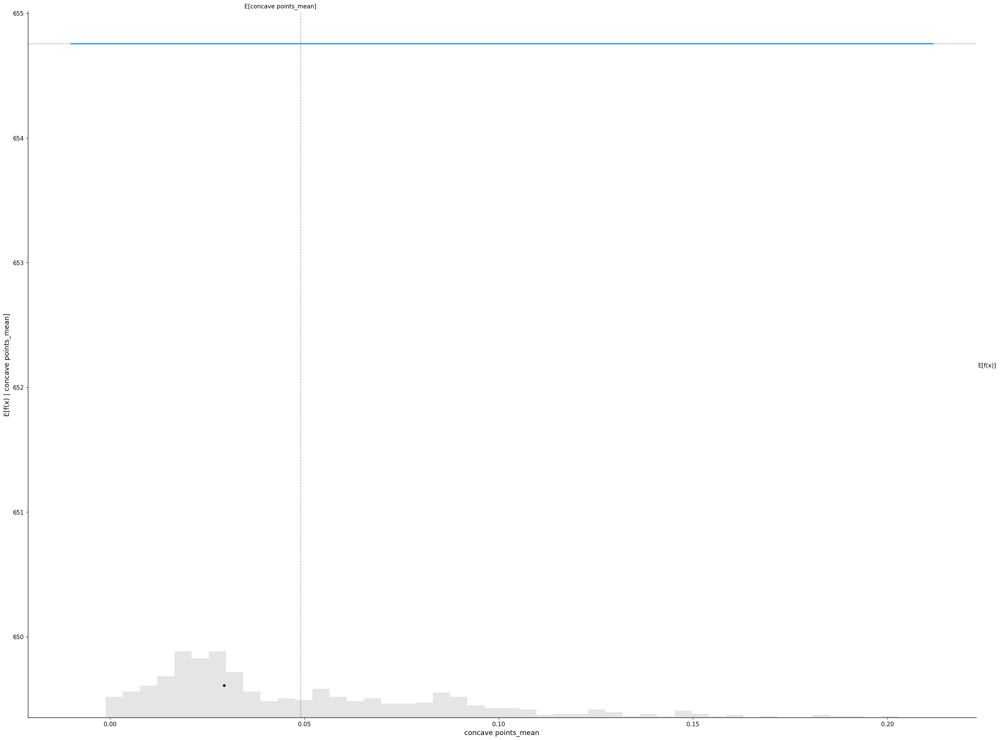

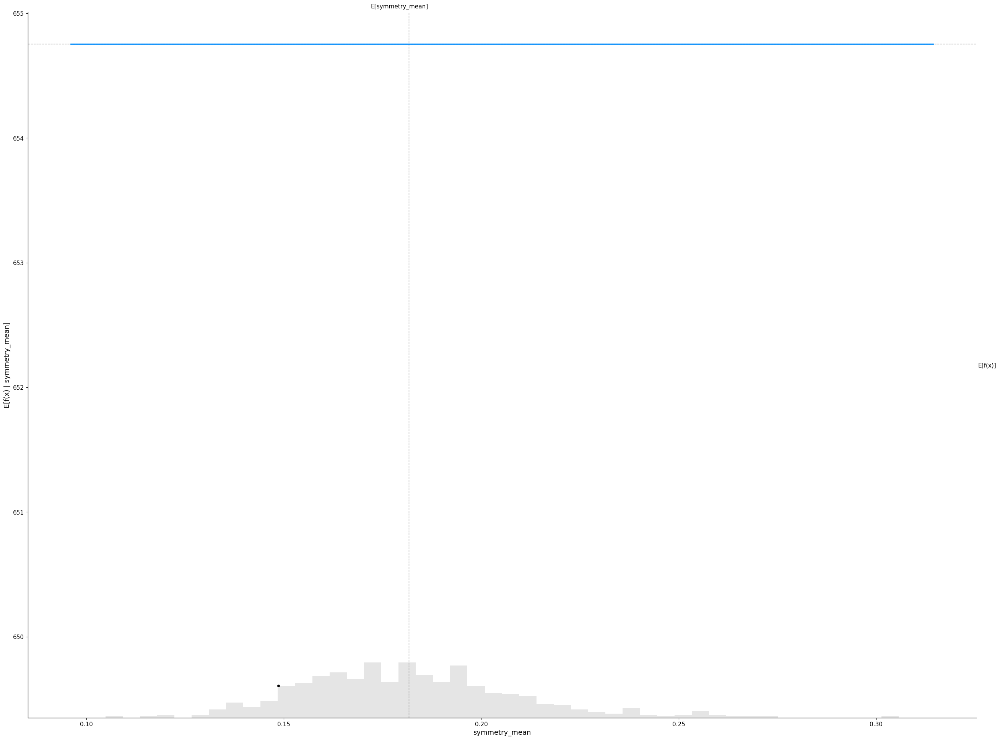

In [109]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(regr.predict, x_train_900)
linear_shap_values = linear_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        regr.predict,
        x_train_900,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

The gray horizontal line in the plot above represents the expected value of the model when applied to the breast cancer dataset. The vertical gray line represents the average value of the other features in the dataset. The blue partial dependence plot line (which the is average value of the model output when we fix the other features to a given value) always passes through the interesection of the two gray expected value lines. We can consider this intersection point as the “center” of the partial dependence plot with respect to the data distribution. The impact of this centering will become clear when we turn to Shapley values next.

/usr/local/lib/python3.9/dist-packages/shap/plots/_beeswarm.py:664: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



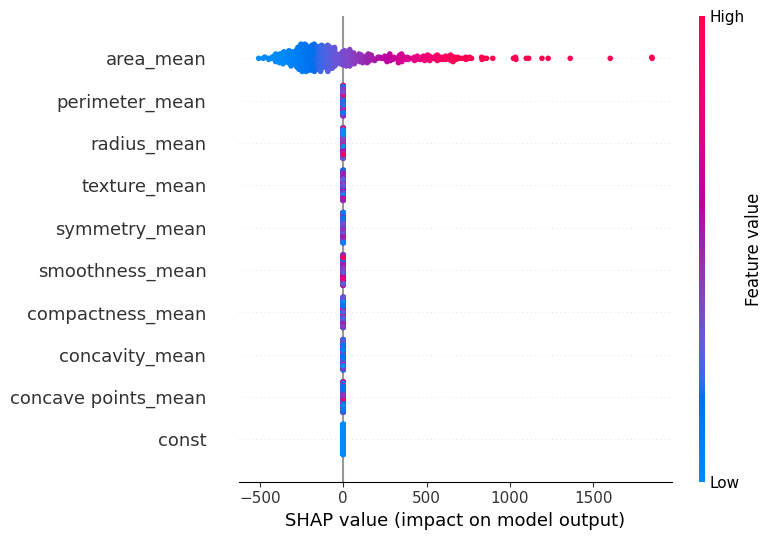

In [85]:
# shap summmary for linear model

shap.summary_plot(linear_shap_values, x_train)

high values of the Latitude variable have a high negative contribution on the prediction, while low values have a high positive contribution.

The area_mean variable has a really high positive contribution when its values are high, and a low negative contribution on low values. The feature const has almost no contribution to the prediction, whether its 
values are high or low.

All variables are shown in the order of global feature importance, the first one being the most important and the last being the least important one.

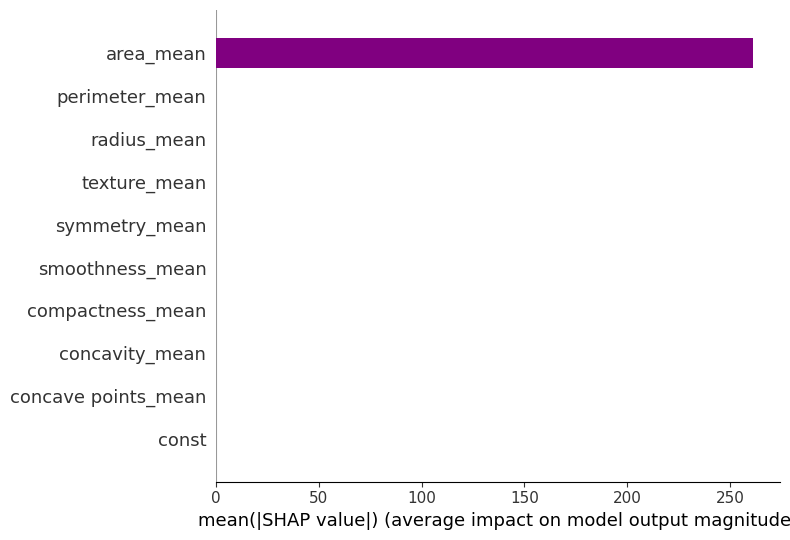

In [86]:
# SHAP variable importance for a Linear Model

shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="purple")


Here the features are ordered from the highest to the lowest effect on the prediction. It takes in account the absolute SHAP value, so it does not matter if the feature affects the prediction in a positive or negative way.

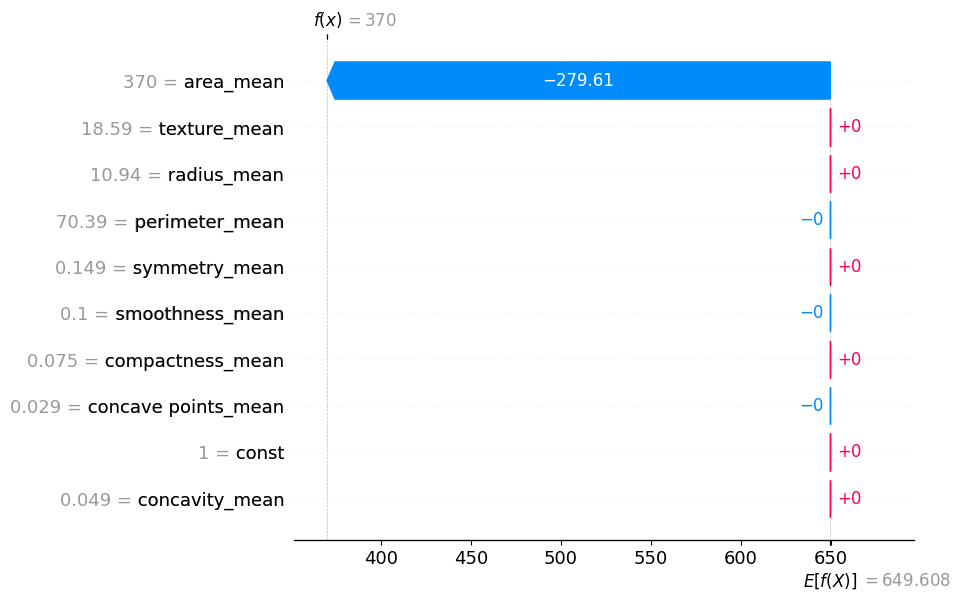

In [87]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

The waterfall plot has the same information, represented in a different manner. Here we can see how the sum of all the SHAP values equals the difference between the prediction f(x) and the expected value E[f(x)].

Interpreting Waterfall SHAP visualization

Let's consider the same sample (sample_ind = 18) Notice the value of revenue in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that f(x) = 370 is what we got as a model output and the expected output for this sample was 370. We came pretty close to determining it as the difference is only 0.04. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that revenue has the biggest and most positive impact in increasing the votes for this specific sample. Followed by year had a negative impact and it bought the votes down again for this sample, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 5.7.

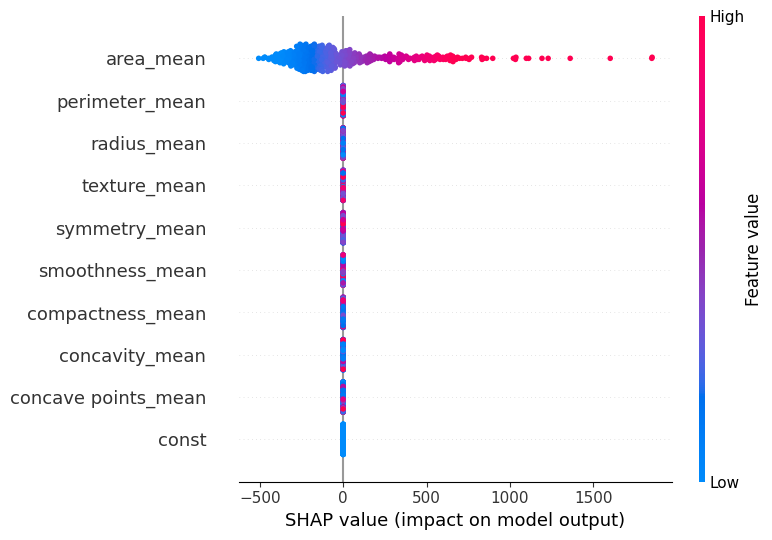

In [88]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

high values of the Latitude variable have a high negative contribution on the prediction, while low values have a high positive contribution.

The area_mean variable has a really high positive contribution when its values are high, and a low negative contribution on low values. The feature const has almost no contribution to the prediction, whether its 
values are high or low.

All variables are shown in the order of global feature importance, the first one being the most important and the last being the least important one.

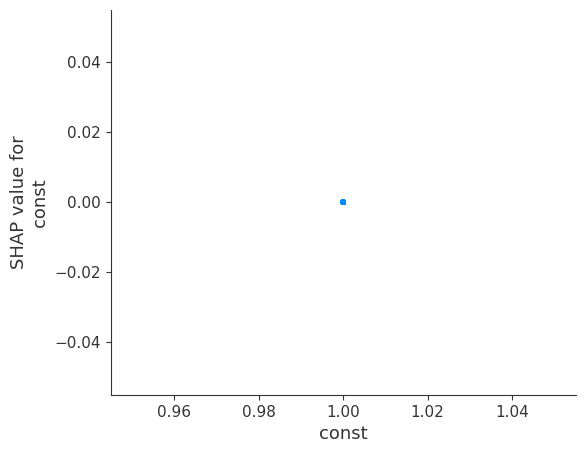

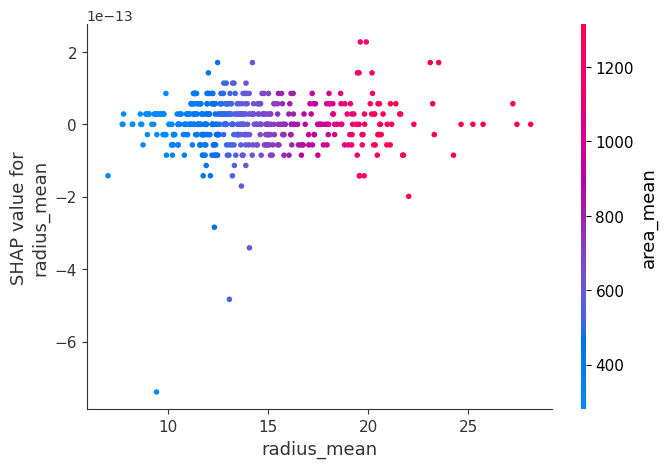

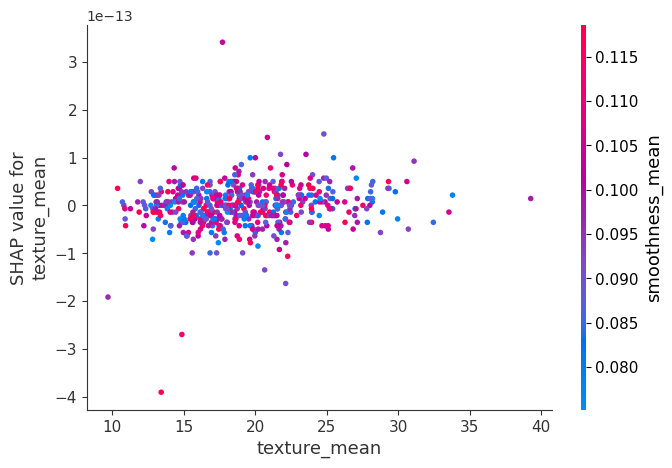

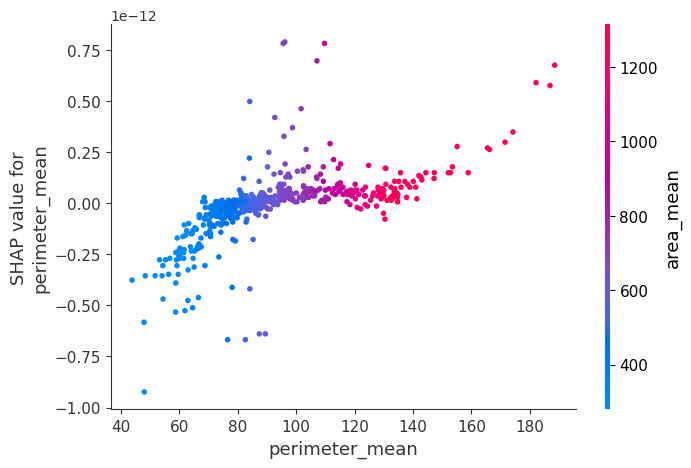

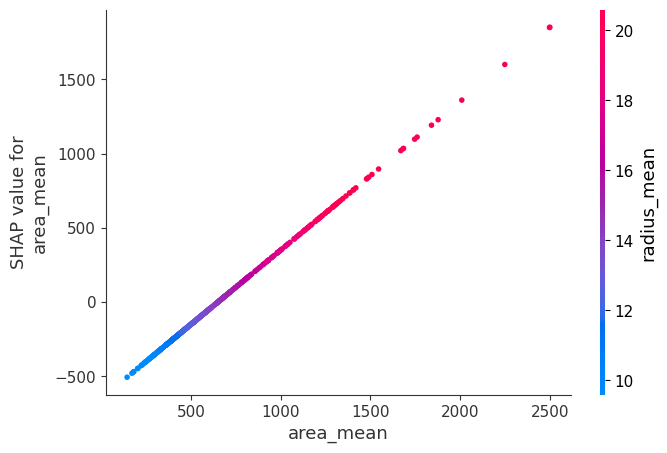

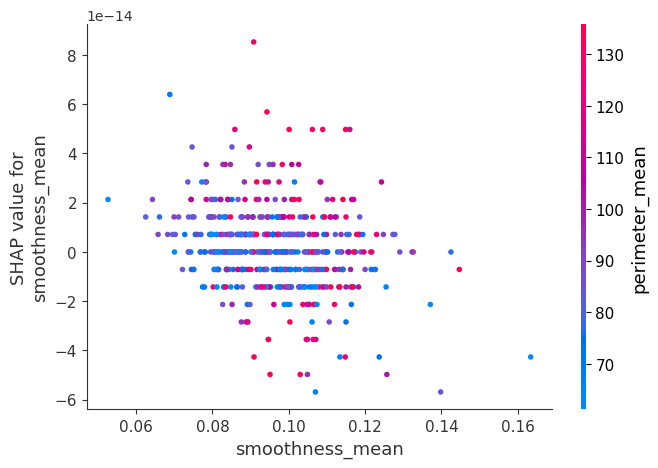

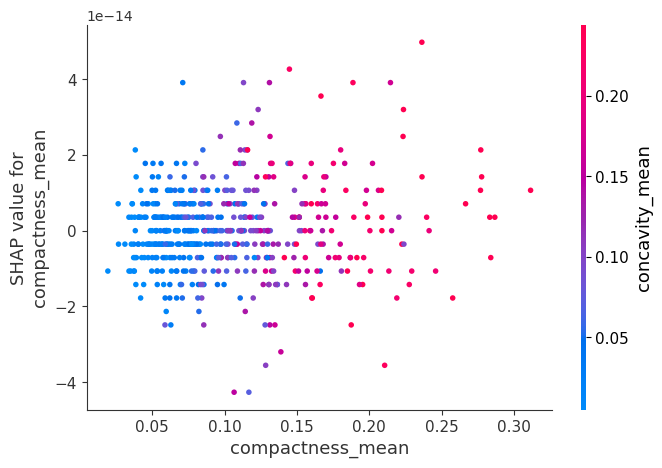

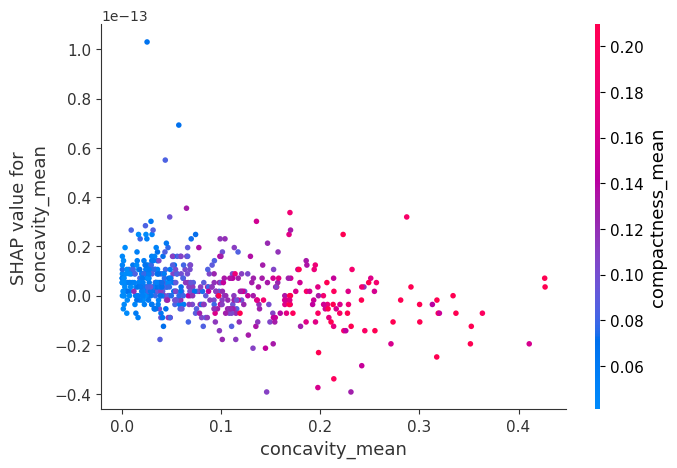

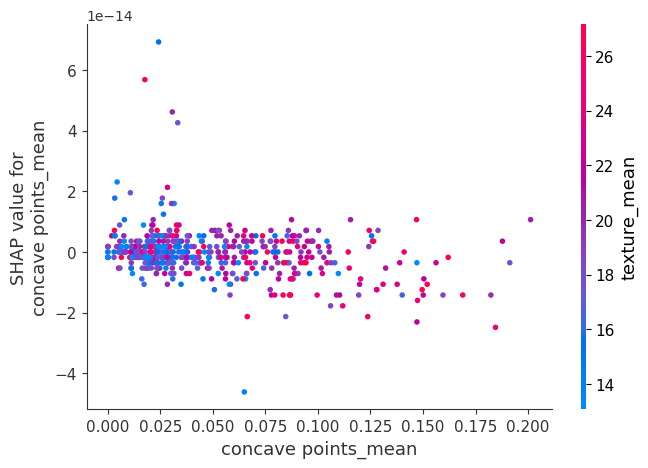

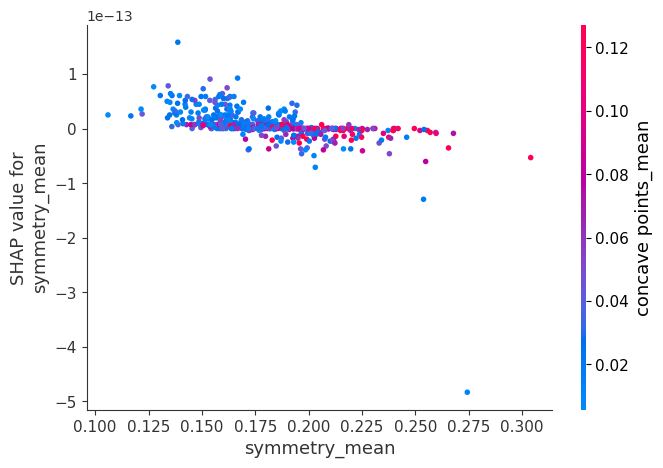

In [89]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

The for loop iterates over each column in the x_train dataframe (presumably the feature matrix used to train the linear model). For each feature, the shap.dependence_plot function is called to create a partial dependence plot that shows how the predicted output of the model changes as the value of the selected feature changes, while holding all other features fixed at a specified baseline value.

The shap.dependence_plot function takes three arguments:

i: the name of the feature to plot the partial dependence of
linear_shap_values.values: the SHAP values for the linear model (presumably generated using the shap.LinearExplainer function)
x_train: the training data used to train the linear model
The resulting partial dependence plots should show the relationship between each feature and the model output, while controlling for the effects of all other features. The SHAP values are used to weight the contribution of each feature to the final model output, allowing for a more interpretable and informative view of the model's behavior than simple coefficient values would provide.

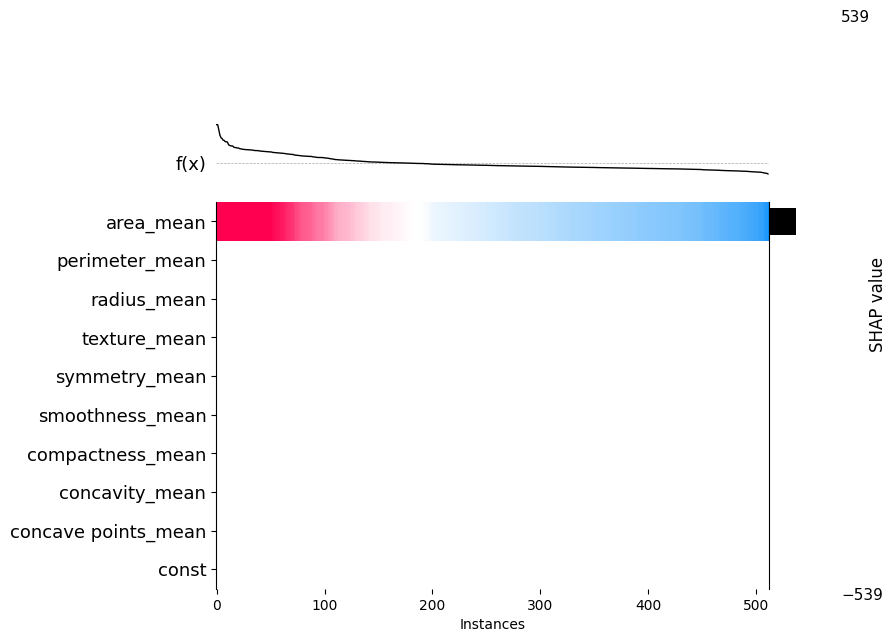

In [94]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model


First, the importance of the variables is labeled on the left side. The horizontal bars on the right side rank the variables from the most important to the least important. The model variable importance represents global interpretability.

This heatmap is based on wine samples from 0 to 500 above roughly. So the X-axis is the instance from 0 to 500 above roughly. The colors show the magnitude of the SHAP values. Look at Wine sample 100 on the right of the heatmap, it has a red color for area_mean, which means area_mean has contributed the most in the dataset.

**Conclusion:**

In this notebook, I have successfully performed Exploratory data analysis and fitting a linear model and getting the accuracy of the model on the breast cancer dataset. I have also performed shap analysis on the dataset. 

**References:**

Kaggle: https://www.kaggle.com/datasets/yasserh/breast-cancer-dataset/code?datasetId=1829286&searchQuery=regre 

TowardsDataScience- https://towardsdatascience.com/explain-any-models-with-the-shap-values-use-the-kernelexplainer-79de9464897a



**LICENSE:**

MIT License

Copyright (c) 2023 Prarthna Nemade

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.